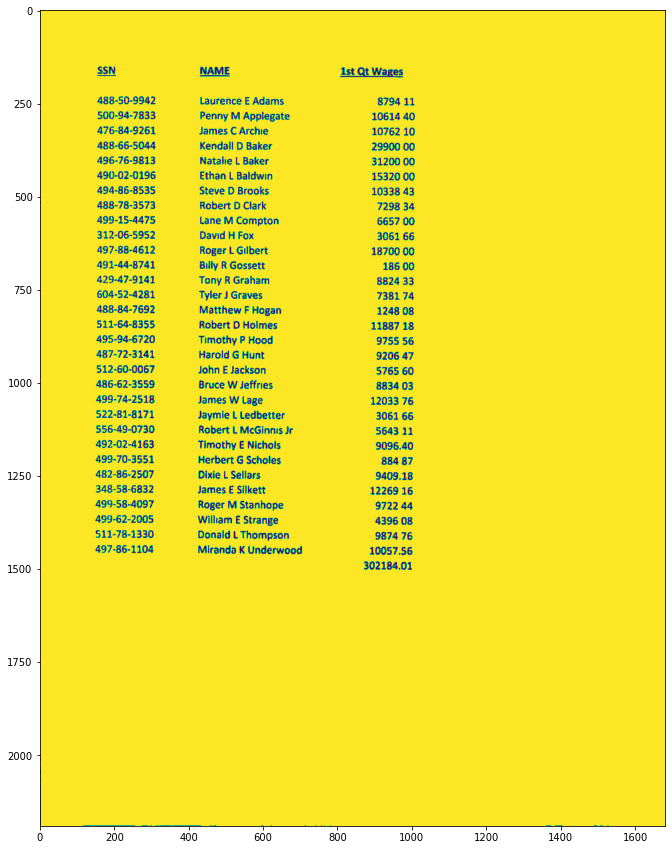

In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
  
# Read Images
img = mpimg.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0633960000.jpeg')

plt.figure(figsize=(15,15))
# Output Images
plt.imshow(img)

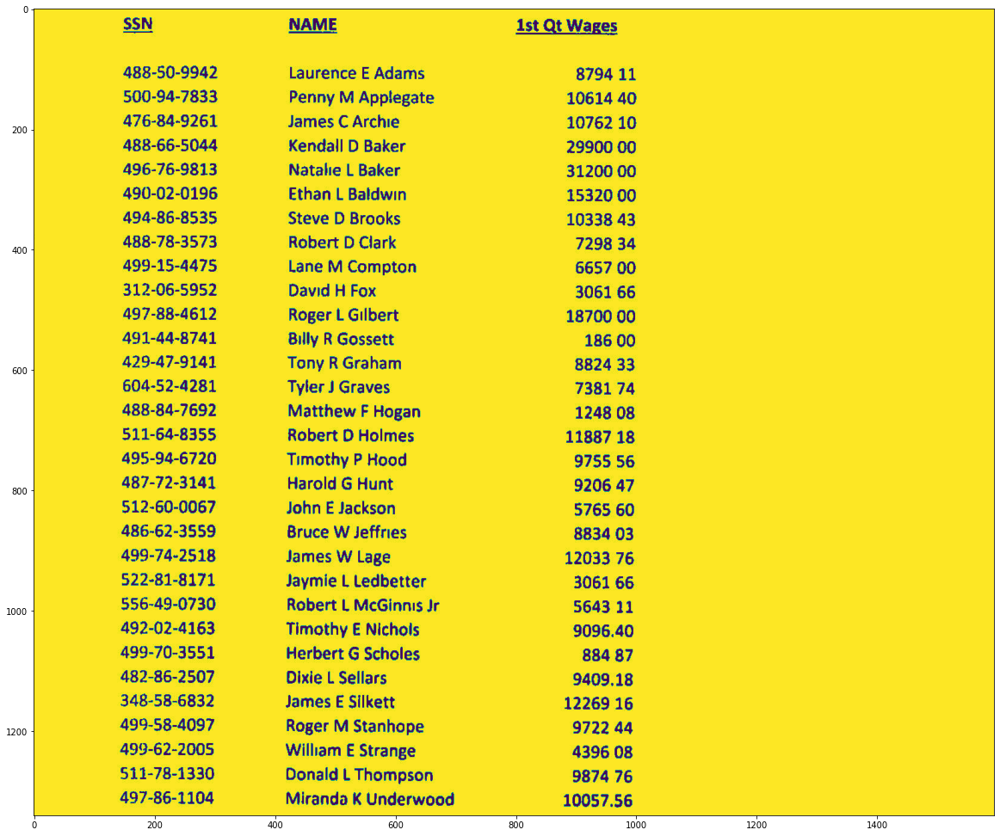

In [2]:
from PIL import Image
import cv2
  
# Opens a image in RGB mode
im = Image.open(r"/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0633960000.jpeg")
#im =cv2.imread('/home/vimal/Documents/table_detect_samples/pre/0347682000.jpeg')
# Size of the image in pixels (size of orginal image)
# (This is not mandatory)
width, height = im.size
  
# Setting the points for cropped image
left = 5
top = height /16
right = 1600
bottom = 3 * height / 4.45
  
# Cropped image of above dimension
# (It will not change orginal image)
im1 = im.crop((left, top, right, bottom))
plt.figure(figsize=(20,20))
plt.imshow(im1)
im1.save('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0633960000_crop.jpeg')
# Shows the image in image viewer

In [3]:
import cv2
import pytesseract
from pytesseract import Output
import pandas as pd

img = cv2.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0633960000_crop.jpeg')
img = cv2.resize(img, (int(img.shape[1] + (img.shape[1] * .1)),
                       int(img.shape[0] + (img.shape[0] * .25))),
                 interpolation=cv2.INTER_AREA)

img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789-:.$%./@& *"'
d = pytesseract.image_to_data(img_rgb, config=custom_config, output_type=Output.DICT)
df = pd.DataFrame(d)

df1 = df[(df.conf != '-1') & (df.text != ' ') & (df.text != '')]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

sorted_blocks = df1.groupby('block_num').first().sort_values('top').index.tolist()
for block in sorted_blocks:
    curr = df1[df1['block_num'] == block]
    sel = curr[curr.text.str.len() > 3]
    # sel = curr
    char_w = (sel.width / sel.text.str.len()).mean()
    prev_par, prev_line, prev_left = 0, 0, 0
    text = ''
    for ix, ln in curr.iterrows():
        # add new line when necessary
        if prev_par != ln['par_num']:
            text += '\n'
            prev_par = ln['par_num']
            prev_line = ln['line_num']
            prev_left = 0
        elif prev_line != ln['line_num']:
            text += '\n'
            prev_line = ln['line_num']
            prev_left = 0

        added = 0  # num of spaces that should be added
        if ln['left'] / char_w > prev_left + 1:
            added = int((ln['left']) / char_w) - prev_left
            text += ' ' * added
        text += ln['text'] + ' '
        prev_left += len(ln['text']) + added + 1
    text += '\n'
    print(text)




         SSN                NAME                        ist Qt Wages 
          488-50-9942        Laurence E Adams                  8794 11 
          500-94-7833        Penny M  Applegate               10614 40 
          476-84-9261        James C Archie                   10762 10 
          488-66-5044        Kendall D Baker                  29900 00 
          496-76-9813        Natalie L Baker                  31200 00 
          490-02-0196        Ethan L Baldwin                  15320 00 
          494-86-8535        Steve D Brooks                   10338 43 
          488-78-3573        Robert D Clark                    7298 34 
          499-15-4475        Lane M Compton                    6657 00 
          312-06-5952        David H Fox                       3061 66 
          497-88-4612        Roger L Gilbert                  18700 00 
          491-44-8741        Billy R Gossett                    186 00 
          429-47-9141        Tony R Graham                     88

In [4]:
test1 = text.replace("   ", ",")

In [5]:
print(test1)


,,,SSN,,,,, NAME,,,,,,,,ist Qt Wages 
,,, 488-50-9942,,  Laurence E Adams,,,,,,8794 11 
,,, 500-94-7833,,  Penny M  Applegate,,,,,10614 40 
,,, 476-84-9261,,  James C Archie,,,,,, 10762 10 
,,, 488-66-5044,,  Kendall D Baker,,,,,,29900 00 
,,, 496-76-9813,,  Natalie L Baker,,,,,,31200 00 
,,, 490-02-0196,,  Ethan L Baldwin,,,,,,15320 00 
,,, 494-86-8535,,  Steve D Brooks,,,,,, 10338 43 
,,, 488-78-3573,,  Robert D Clark,,,,,,  7298 34 
,,, 499-15-4475,,  Lane M Compton,,,,,,  6657 00 
,,, 312-06-5952,,  David H Fox,,,,,,,  3061 66 
,,, 497-88-4612,,  Roger L Gilbert,,,,,,18700 00 
,,, 491-44-8741,,  Billy R Gossett,,,,,,  186 00 
,,, 429-47-9141,,  Tony R Graham,,,,,,,8824 33 
,,, 604-52-4281,,  Tyler J Graves,,,,,,  7381 74 
,,, 488-84-7692,,  Matthew  F Hogan,,,,,,1248 08 
,,, 511-64-8355,,  Robert D Holmes,,,,,,11887 18 
,,, 495-94-6720,,  Timothy P Hood,,,,,,  9755 56 
,,, 487-72-3141,,  Harold G Hunt,,,,,,,9206 47 
,,, 512-60-0067,,  John E Jackson,,,,,,  5765 60 
,,, 486-62-3559

In [6]:
import re
pattern = re.compile(r'(,){2,}')
x = (re.sub(pattern, ',', test1))

In [7]:
text_file = open("/home/vimal/Documents/table_detect_samples/unstructured tables/text/0633960000_text.txt", "wt")
n = text_file.write(x)
text_file.close()

In [8]:
import pandas as pd

df = pd.read_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/text/0633960000_text.txt')
df = df.dropna(axis=1)
print (df)


             SSN                    NAME ist Qt Wages 
0    488-50-9942        Laurence E Adams      8794 11 
1    500-94-7833      Penny M  Applegate     10614 40 
2    476-84-9261          James C Archie     10762 10 
3    488-66-5044         Kendall D Baker     29900 00 
4    496-76-9813         Natalie L Baker     31200 00 
5    490-02-0196         Ethan L Baldwin     15320 00 
6    494-86-8535          Steve D Brooks     10338 43 
7    488-78-3573          Robert D Clark      7298 34 
8    499-15-4475          Lane M Compton      6657 00 
9    312-06-5952             David H Fox      3061 66 
10   497-88-4612         Roger L Gilbert     18700 00 
11   491-44-8741         Billy R Gossett       186 00 
12   429-47-9141           Tony R Graham      8824 33 
13   604-52-4281          Tyler J Graves      7381 74 
14   488-84-7692        Matthew  F Hogan      1248 08 
15   511-64-8355         Robert D Holmes     11887 18 
16   495-94-6720          Timothy P Hood      9755 56 
17   487-7

In [9]:
df

,SSN,NAME,ist Qt Wages
0,488-50-9942,Laurence E Adams,8794 11
1,500-94-7833,Penny M Applegate,10614 40
2,476-84-9261,James C Archie,10762 10
3,488-66-5044,Kendall D Baker,29900 00
4,496-76-9813,Natalie L Baker,31200 00
5,490-02-0196,Ethan L Baldwin,15320 00
6,494-86-8535,Steve D Brooks,10338 43
7,488-78-3573,Robert D Clark,7298 34
8,499-15-4475,Lane M Compton,6657 00
9,312-06-5952,David H Fox,3061 66


In [10]:
df.to_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/CSV/0633960000_excel.csv', 
                  index = None)

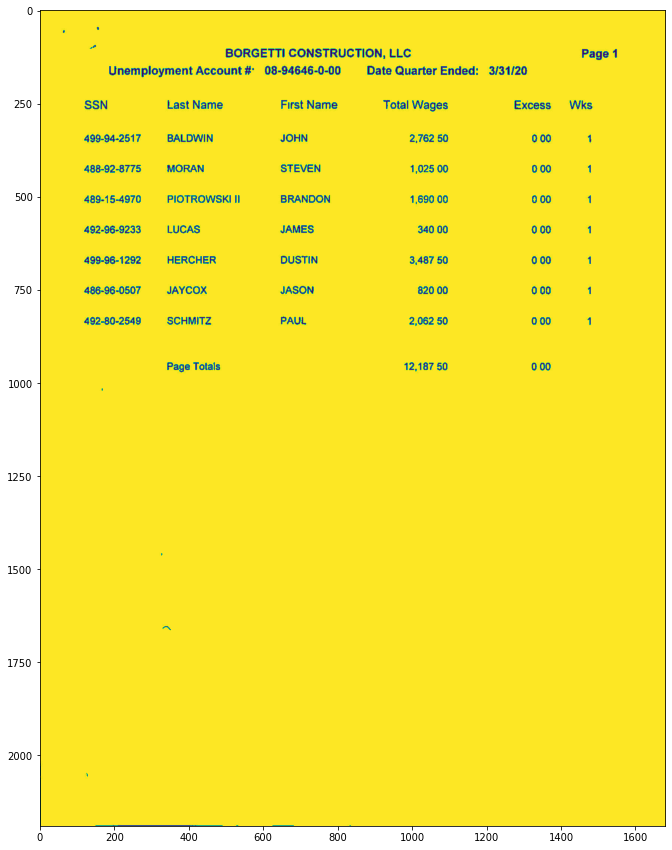

In [11]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
  
# Read Images
img = mpimg.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0894646000.jpeg')

plt.figure(figsize=(15,15))
# Output Images
plt.imshow(img)

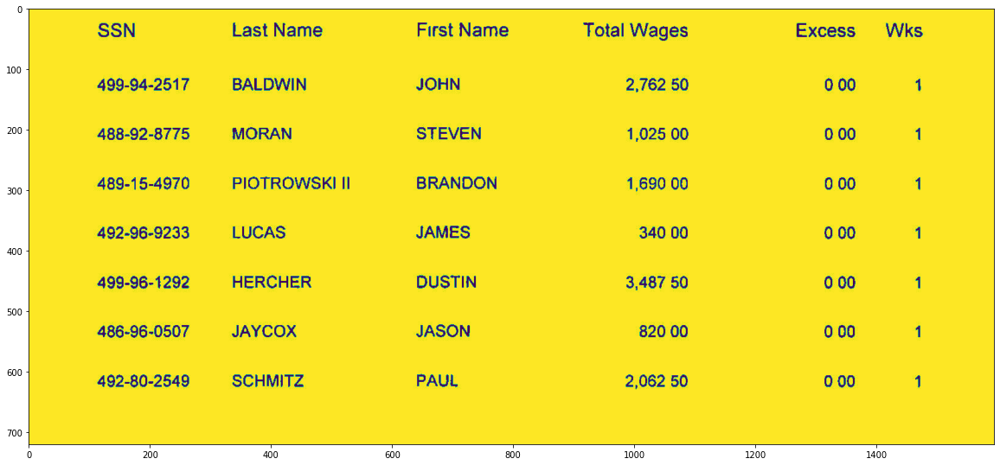

In [12]:
from PIL import Image
import cv2
  
# Opens a image in RGB mode
im = Image.open(r"/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0894646000.jpeg")
#im =cv2.imread('/home/vimal/Documents/table_detect_samples/pre/0347682000.jpeg')
# Size of the image in pixels (size of orginal image)
# (This is not mandatory)
width, height = im.size
  
# Setting the points for cropped image
left = 5
top = height /10
right = 1600
bottom = 3 * height / 7
  
# Cropped image of above dimension
# (It will not change orginal image)
im1 = im.crop((left, top, right, bottom))
plt.figure(figsize=(20,20))
plt.imshow(im1)
im1.save('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0894646000_crop.jpeg')
# Shows the image in image viewer

In [13]:
import cv2
import pytesseract
from pytesseract import Output
import pandas as pd

img = cv2.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0894646000_crop.jpeg')
img = cv2.resize(img, (int(img.shape[1] + (img.shape[1] * .1)),
                       int(img.shape[0] + (img.shape[0] * .25))),
                 interpolation=cv2.INTER_AREA)

img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789-:.$%./@& *"'
d = pytesseract.image_to_data(img_rgb, config=custom_config, output_type=Output.DICT)
df = pd.DataFrame(d)

df1 = df[(df.conf != '-1') & (df.text != ' ') & (df.text != '')]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

sorted_blocks = df1.groupby('block_num').first().sort_values('top').index.tolist()
for block in sorted_blocks:
    curr = df1[df1['block_num'] == block]
    sel = curr[curr.text.str.len() > 3]
    # sel = curr
    char_w = (sel.width / sel.text.str.len()).mean()
    prev_par, prev_line, prev_left = 0, 0, 0
    text = ''
    for ix, ln in curr.iterrows():
        # add new line when necessary
        if prev_par != ln['par_num']:
            text += '\n'
            prev_par = ln['par_num']
            prev_line = ln['line_num']
            prev_left = 0
        elif prev_line != ln['line_num']:
            text += '\n'
            prev_line = ln['line_num']
            prev_left = 0

        added = 0  # num of spaces that should be added
        if ln['left'] / char_w > prev_left + 1:
            added = int((ln['left']) / char_w) - prev_left
            text += ' ' * added
        text += ln['text'] + ' '
        prev_left += len(ln['text']) + added + 1
    text += '\n'
    print(text)




       SSN           Last Name          First Name       Total Wages           Excess   Wks 
       499-94-2517   BALDWIN            JOHN                 2.762 50             000       1 
       488-92-8775   MORAN              STEVEN                1025 00             000       1 
       489-15-4970   PIOTROWSKI II      BRANDON               1.690 00            000       1 
       492-96-9233   LUCAS              JAMES                  340 00             000       1 
       499-96-1292   HERCHER            DUSTIN               3487 50              000       1 
       486-96-0507   JAYCOX             JASON                  820 00             000       1 
       492-80-2549   SCHMITZ            PAUL                 2.062 50             000      1 



In [14]:
test1 = text.replace("   ", ",")
print(test1)


,, SSN,,,  Last Name,,, First Name,, Total Wages,,,  Excess,Wks 
,, 499-94-2517,BALDWIN,,,,JOHN,,,,,  2.762 50,,,, 000,, 1 
,, 488-92-8775,MORAN,,,,  STEVEN,,,,, 1025 00,,,, 000,, 1 
,, 489-15-4970,PIOTROWSKI II,,BRANDON,,,,,1.690 00,,,,000,, 1 
,, 492-96-9233,LUCAS,,,,  JAMES,,,,,,340 00,,,, 000,, 1 
,, 499-96-1292,HERCHER,,,,DUSTIN,,,,,3487 50,,,,  000,, 1 
,, 486-96-0507,JAYCOX,,,, JASON,,,,,,820 00,,,, 000,, 1 
,, 492-80-2549,SCHMITZ,,,,PAUL,,,,,  2.062 50,,,, 000,,1 



In [15]:
import re
pattern = re.compile(r'(,){2,}')
x = (re.sub(pattern, ',', test1))

In [16]:
text_file = open("/home/vimal/Documents/table_detect_samples/unstructured tables/text/0894646000_text.txt", "wt")
n = text_file.write(x)
text_file.close()

In [17]:
import pandas as pd

df = pd.read_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/text/0894646000_text.txt')
df = df.dropna(axis=1)
print (df)


            SSN      Last Name  First Name  Total Wages    Excess  Wks 
0   499-94-2517        BALDWIN        JOHN     2.762 50         0     1
1   488-92-8775          MORAN      STEVEN      1025 00         0     1
2   489-15-4970  PIOTROWSKI II     BRANDON     1.690 00         0     1
3   492-96-9233          LUCAS       JAMES       340 00         0     1
4   499-96-1292        HERCHER      DUSTIN      3487 50         0     1
5   486-96-0507         JAYCOX       JASON       820 00         0     1
6   492-80-2549        SCHMITZ        PAUL     2.062 50         0     1


In [18]:
df.to_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/CSV/0894646000_text.csv', 
                  index = None)

In [19]:
df

,SSN,Last Name,First Name,Total Wages,Excess,Wks
0,499-94-2517,BALDWIN,JOHN,2.762 50,0,1
1,488-92-8775,MORAN,STEVEN,1025 00,0,1
2,489-15-4970,PIOTROWSKI II,BRANDON,1.690 00,0,1
3,492-96-9233,LUCAS,JAMES,340 00,0,1
4,499-96-1292,HERCHER,DUSTIN,3487 50,0,1
5,486-96-0507,JAYCOX,JASON,820 00,0,1
6,492-80-2549,SCHMITZ,PAUL,2.062 50,0,1


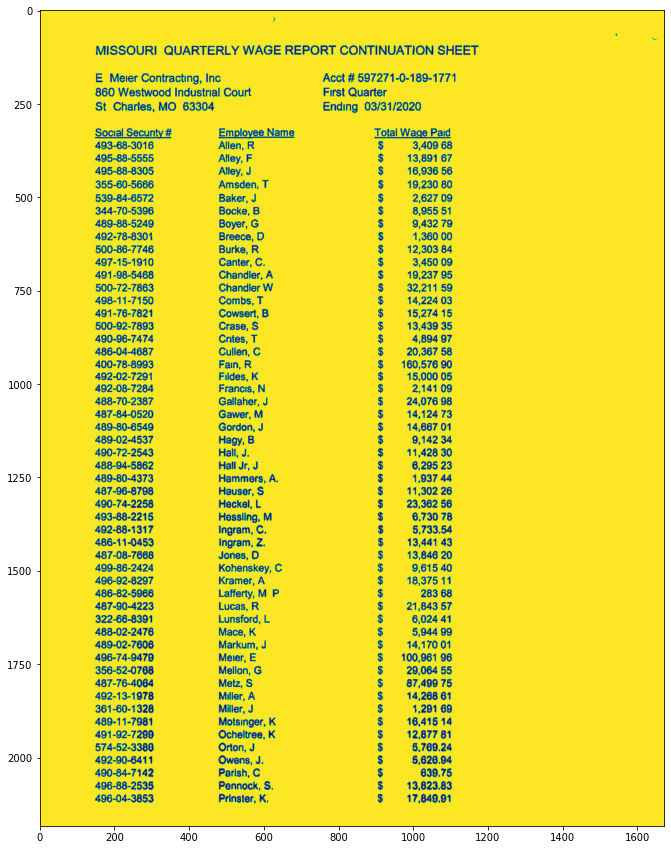

In [20]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
  
# Read Images
img = mpimg.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0430556000.jpeg')

plt.figure(figsize=(15,15))
# Output Images
plt.imshow(img)

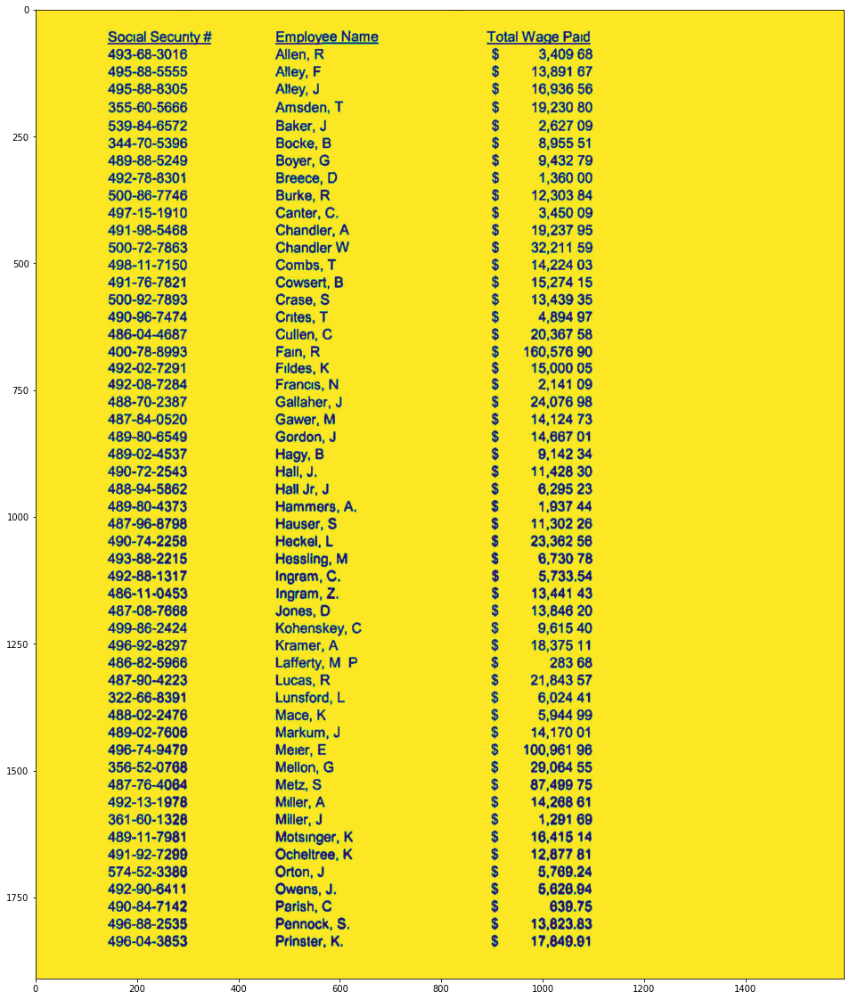

In [22]:
from PIL import Image
import cv2
  
# Opens a image in RGB mode
im = Image.open(r"/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0430556000.jpeg")
#im =cv2.imread('/home/vimal/Documents/table_detect_samples/pre/0347682000.jpeg')
# Size of the image in pixels (size of orginal image)
# (This is not mandatory)
width, height = im.size
  
# Setting the points for cropped image
left = 5
top = height /8
right = 1600
bottom = 3 * height / 3
  
# Cropped image of above dimension
# (It will not change orginal image)
im1 = im.crop((left, top, right, bottom))
plt.figure(figsize=(20,20))
plt.imshow(im1)
im1.save('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0430556000_crop.jpeg')
# Shows the image in image viewer

In [23]:
import cv2
import pytesseract
from pytesseract import Output
import pandas as pd

img = cv2.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0430556000_crop.jpeg')
img = cv2.resize(img, (int(img.shape[1] + (img.shape[1] * .1)),
                       int(img.shape[0] + (img.shape[0] * .25))),
                 interpolation=cv2.INTER_AREA)

img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789-:.$%./@& *"'
d = pytesseract.image_to_data(img_rgb, config=custom_config, output_type=Output.DICT)
df = pd.DataFrame(d)

df1 = df[(df.conf != '-1') & (df.text != ' ') & (df.text != '')]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

sorted_blocks = df1.groupby('block_num').first().sort_values('top').index.tolist()
for block in sorted_blocks:
    curr = df1[df1['block_num'] == block]
    sel = curr[curr.text.str.len() > 3]
    # sel = curr
    char_w = (sel.width / sel.text.str.len()).mean()
    prev_par, prev_line, prev_left = 0, 0, 0
    text = ''
    for ix, ln in curr.iterrows():
        # add new line when necessary
        if prev_par != ln['par_num']:
            text += '\n'
            prev_par = ln['par_num']
            prev_line = ln['line_num']
            prev_left = 0
        elif prev_line != ln['line_num']:
            text += '\n'
            prev_line = ln['line_num']
            prev_left = 0

        added = 0  # num of spaces that should be added
        if ln['left'] / char_w > prev_left + 1:
            added = int((ln['left']) / char_w) - prev_left
            text += ' ' * added
        text += ln['text'] + ' '
        prev_left += len(ln['text']) + added + 1
    text += '\n'
    print(text)




          Social Security        Employee  Name                Total Wage Paid 
          493-68-3016            Allen R                        $     3.409 68 
          495-88-5555            Alley F                        $    13.891 67 
          495-88-8305            Alley J                        $    16936  56 
          355-60-5666            Amsden   T                     $    19.230 80 
          539-84-6572            Baker  J                       $     2.627 09 
          344-70-5396            Bocke. B                       $     8955  51 
          489-88-5249            Boyer G                        $     9.432 79 
          492-78-8301            Breece. D                      $     1360  00 
          500-86-7746            Burke  R                       $    12.303 84 
          497-15-1910            Canter C.                      $     3.450 09 
          491-98-5468            Chandler A                     $    19.237 95 
          500-72-7863            Chandl

In [36]:
test1 = text.replace("        ", ",")
print(test1)


,  Social Security,Employee  Name,,Total Wage Paid 
,  493-68-3016,    Allen R,,,$     3.409 68 
,  495-88-5555,    Alley F,,,$    13.891 67 
,  495-88-8305,    Alley J,,,$    16936  56 
,  355-60-5666,    Amsden   T,,     $    19.230 80 
,  539-84-6572,    Baker  J,,       $     2.627 09 
,  344-70-5396,    Bocke. B,,       $     8955  51 
,  489-88-5249,    Boyer G,,,$     9.432 79 
,  492-78-8301,    Breece. D,,      $     1360  00 
,  500-86-7746,    Burke  R,,       $    12.303 84 
,  497-15-1910,    Canter C.,,      $     3.450 09 
,  491-98-5468,    Chandler A,,     $    19.237 95 
,  500-72-7863,    Chandler W,,     $    32.211 59 
,  498-11-7150,    Combs   T,,      $    14.224 03 
,  491-76-7821,    Cowsert  B,,     $    15.274 15 
,  500-92-7893,    Crase  S,,       $    13.439 35 
,  490-96-7474,    Crites T,,       $     4894  97 
,  486-04-4687,    Cullen. C,,      $    20367  58 
,  400-78-8993,    Fain R,,, $   160576  90 
,  492-02-7291,    Fildes. K,,      $    15.00

In [37]:
import re
pattern = re.compile(r'(,){2,}')
x = (re.sub(pattern, ',', test1))

In [38]:
text_file = open("/home/vimal/Documents/table_detect_samples/unstructured tables/text/0430556000_text.txt", "wt")
n = text_file.write(x)
text_file.close()

In [41]:
import pandas as pd

df = pd.read_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/text/0430556000_text.txt')
df = df.dropna(how='all', axis=1)
df


,Social Security,Employee Name,Total Wage Paid
0,493-68-3016,Allen R,$ 3.409 68
1,495-88-5555,Alley F,$ 13.891 67
2,495-88-8305,Alley J,$ 16936 56
3,355-60-5666,Amsden T,$ 19.230 80
4,539-84-6572,Baker J,$ 2.627 09
5,344-70-5396,Bocke. B,$ 8955 51
6,489-88-5249,Boyer G,$ 9.432 79
7,492-78-8301,Breece. D,$ 1360 00
8,500-86-7746,Burke R,$ 12.303 84
9,497-15-1910,Canter C.,$ 3.450 09


In [42]:
df.to_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/CSV/0430556000_text.csv', 
                  index = None)

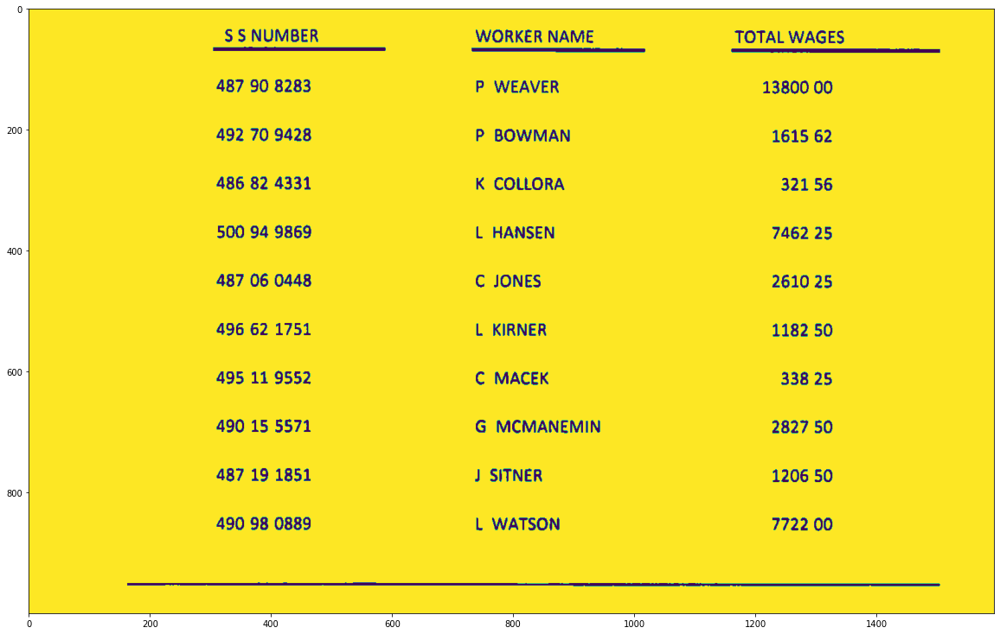

In [37]:
import cv2
import numpy as np
img = cv2.imread("/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/00128371000_crop.jpeg", 0)
_, blackAndWhite = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
nlabels, labels, stats, centroids = cv2.connectedComponentsWithStats(blackAndWhite, None, None, None, 8, cv2.CV_32S)
sizes = stats[1:, -1] #get CC_STAT_AREA component
img2 = np.zeros((labels.shape), np.uint8)
for i in range(0, nlabels - 1):
    if sizes[i] >= 50:   #filter small dotted regions
        img2[labels == i + 1] = 255
res = cv2.bitwise_not(img2)

plt.figure(figsize=(20,20))
plt.imshow(res)

In [38]:
from PIL import Image
im = Image.fromarray(res)
im.save("/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/00128371000_crop.jpeg")

In [39]:
import cv2
import pytesseract
from pytesseract import Output
import pandas as pd

img = cv2.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/00128371000_crop.jpeg')
img = cv2.resize(img, (int(img.shape[1] + (img.shape[1] * .1)),
                       int(img.shape[0] + (img.shape[0] * .25))),
                 interpolation=cv2.INTER_AREA)

img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789-:.$%./@& *"'
d = pytesseract.image_to_data(img_rgb, config=custom_config, output_type=Output.DICT)
df = pd.DataFrame(d)

df1 = df[(df.conf != '-1') & (df.text != ' ') & (df.text != '')]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

sorted_blocks = df1.groupby('block_num').first().sort_values('top').index.tolist()
for block in sorted_blocks:
    curr = df1[df1['block_num'] == block]
    sel = curr[curr.text.str.len() > 3]
    # sel = curr
    char_w = (sel.width / sel.text.str.len()).mean()
    prev_par, prev_line, prev_left = 0, 0, 0
    text = ''
    for ix, ln in curr.iterrows():
        # add new line when necessary
        if prev_par != ln['par_num']:
            text += '\n'
            prev_par = ln['par_num']
            prev_line = ln['line_num']
            prev_left = 0
        elif prev_line != ln['line_num']:
            text += '\n'
            prev_line = ln['line_num']
            prev_left = 0

        added = 0  # num of spaces that should be added
        if ln['left'] / char_w > prev_left + 1:
            added = int((ln['left']) / char_w) - prev_left
            text += ' ' * added
        text += ln['text'] + ' '
        prev_left += len(ln['text']) + added + 1
    text += '\n'
    print(text)




                    SS NUMBER                 WORKER  NAME               TOTAL WAGES 
                   487 90 8283                P WEAVER                      13800 00 
                   492 70 9428                P BOWMAN                       1615 62 
                   486 82 4331                K COLLORA                       32156 
                   500 94 9869                L HANSEN                       7462 25 
                   487 06 0448                C JONES                        2610 25 
                   496 62 1751                L KIRNER                       1182 50 
                   495 11 9552                C MACEK                         338 25 
                   490 15 5571                G MCMANEMIN                    2827 50 
                   487 19 1851                J SITNER                       1206 50 
                   490 98 0889                L WATSON                       7722 00 



In [40]:
test1 = text.replace("   ", ",")
print(test1)


,,,,,,  SS NUMBER,,,,,  WORKER  NAME,,,,,TOTAL WAGES 
,,,,,, 487 90 8283,,,,, P WEAVER,,,,,,, 13800 00 
,,,,,, 492 70 9428,,,,, P BOWMAN,,,,,,,  1615 62 
,,,,,, 486 82 4331,,,,, K COLLORA,,,,,,,  32156 
,,,,,, 500 94 9869,,,,, L HANSEN,,,,,,,  7462 25 
,,,,,, 487 06 0448,,,,, C JONES,,,,,,,,2610 25 
,,,,,, 496 62 1751,,,,, L KIRNER,,,,,,,  1182 50 
,,,,,, 495 11 9552,,,,, C MACEK,,,,,,,, 338 25 
,,,,,, 490 15 5571,,,,, G MCMANEMIN,,,,,,  2827 50 
,,,,,, 487 19 1851,,,,, J SITNER,,,,,,,  1206 50 
,,,,,, 490 98 0889,,,,, L WATSON,,,,,,,  7722 00 



In [41]:
import re
pattern = re.compile(r'(,){2,}')
x = (re.sub(pattern, ',', test1))

text_file = open("/home/vimal/Documents/table_detect_samples/unstructured tables/text/00128371000_text.txt", "wt")
n = text_file.write(x)
text_file.close()

import pandas as pd

df = pd.read_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/text/00128371000_text.txt')
df = df.dropna(how='all', axis=1)
df.to_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/CSV/00128371000_text.csv', 
                  index = None)
df

,SS NUMBER,WORKER NAME,TOTAL WAGES
0,487 90 8283,P WEAVER,13800 00
1,492 70 9428,P BOWMAN,1615 62
2,486 82 4331,K COLLORA,32156
3,500 94 9869,L HANSEN,7462 25
4,487 06 0448,C JONES,2610 25
5,496 62 1751,L KIRNER,1182 50
6,495 11 9552,C MACEK,338 25
7,490 15 5571,G MCMANEMIN,2827 50
8,487 19 1851,J SITNER,1206 50
9,490 98 0889,L WATSON,7722 00


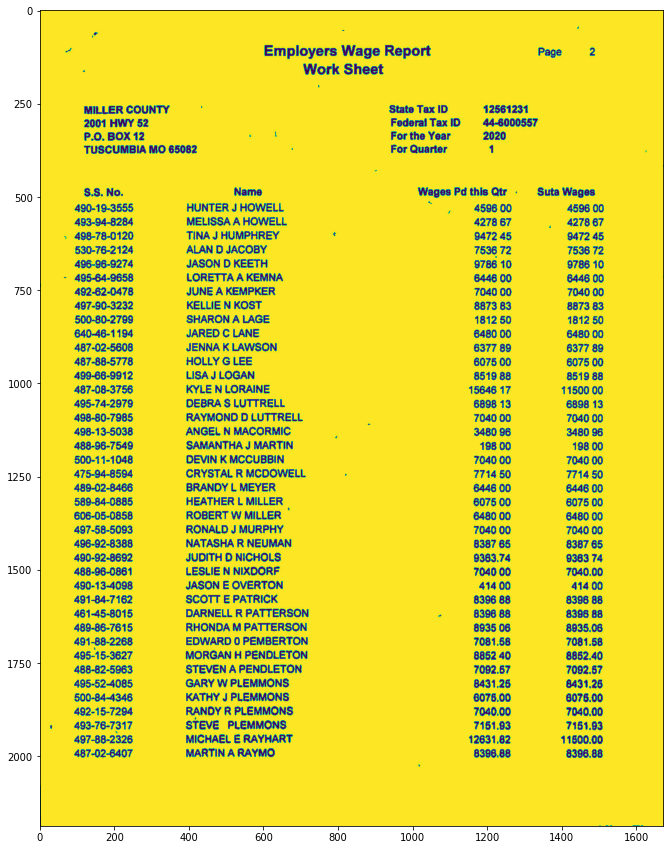

In [43]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
  
# Read Images
img = mpimg.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0812921000.jpeg')

plt.figure(figsize=(15,15))
# Output Images
plt.imshow(img)

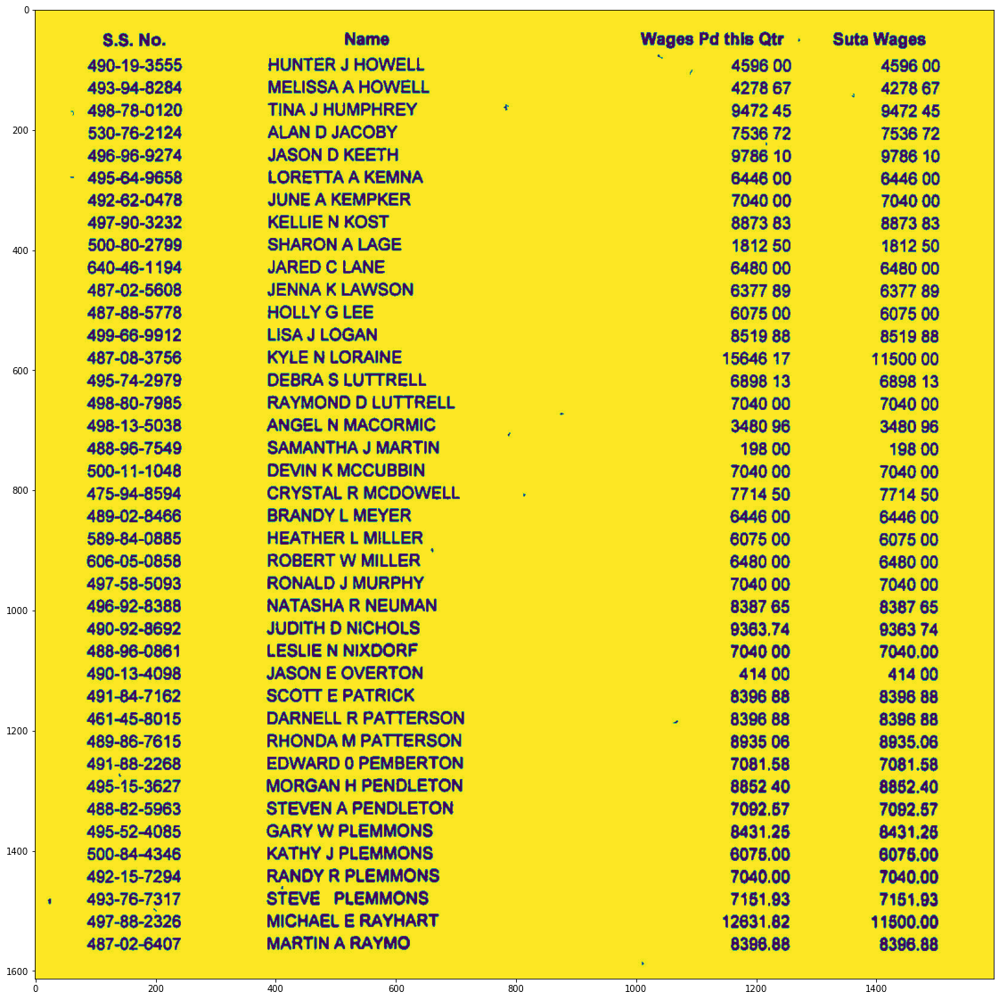

In [44]:
from PIL import Image
import cv2
  
# Opens a image in RGB mode
im = Image.open(r"/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0812921000.jpeg")
#im =cv2.imread('/home/vimal/Documents/table_detect_samples/pre/0347682000.jpeg')
# Size of the image in pixels (size of orginal image)
# (This is not mandatory)
width, height = im.size
  
# Setting the points for cropped image
left = 5
top = height /5
right = 1600
bottom = 3 * height / 3.2

  
# Cropped image of above dimension
# (It will not change orginal image)
im1 = im.crop((left, top, right, bottom))
plt.figure(figsize=(20,20))
plt.imshow(im1)
im1.save('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0812921000_crop.jpeg')
# Shows the image in image viewer

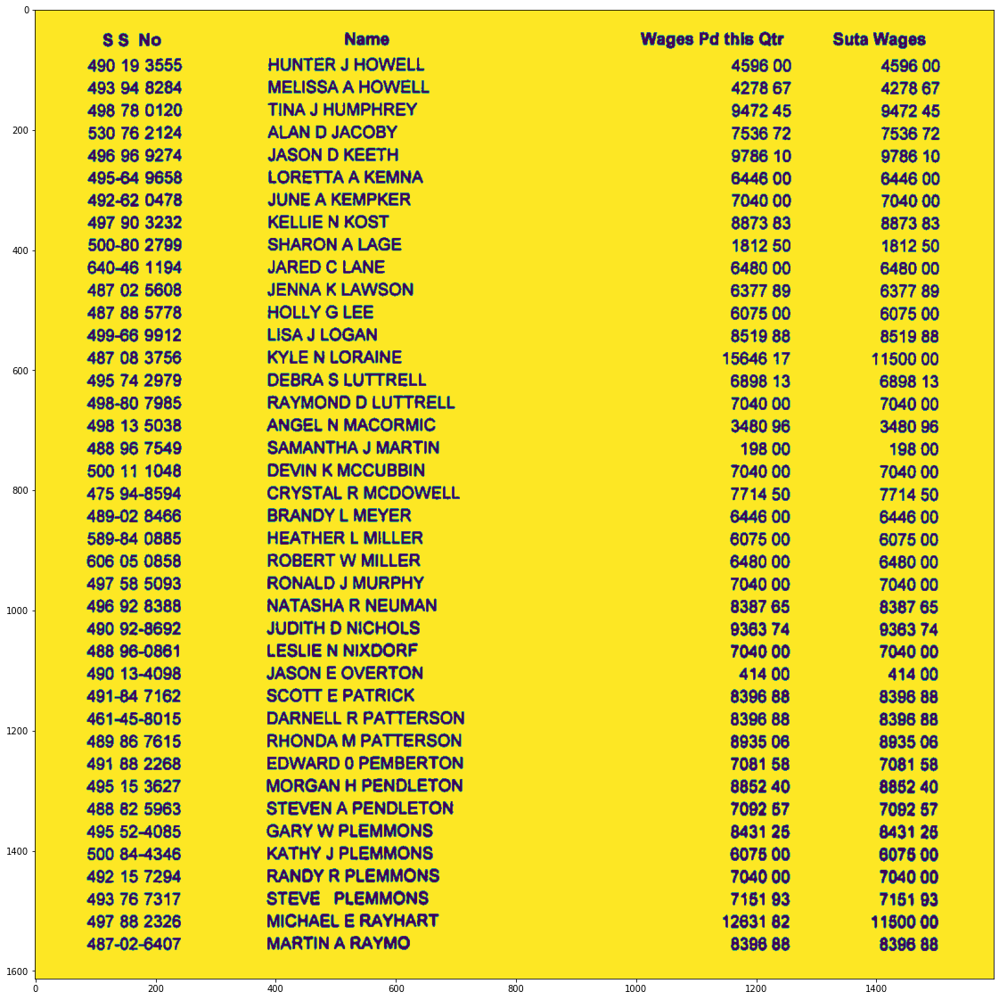

In [45]:
import cv2
import numpy as np
img = cv2.imread("/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0812921000_crop.jpeg", 0)
_, blackAndWhite = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
nlabels, labels, stats, centroids = cv2.connectedComponentsWithStats(blackAndWhite, None, None, None, 8, cv2.CV_32S)
sizes = stats[1:, -1] #get CC_STAT_AREA component
img2 = np.zeros((labels.shape), np.uint8)
for i in range(0, nlabels - 1):
    if sizes[i] >= 50:   #filter small dotted regions
        img2[labels == i + 1] = 255
res = cv2.bitwise_not(img2)

plt.figure(figsize=(20,20))
plt.imshow(res)

In [46]:
from PIL import Image
im = Image.fromarray(res)
im.save("/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0812921000_crop.jpeg")

In [47]:
import cv2
import pytesseract
from pytesseract import Output
import pandas as pd

img = cv2.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0812921000_crop.jpeg')
img = cv2.resize(img, (int(img.shape[1] + (img.shape[1] * .1)),
                       int(img.shape[0] + (img.shape[0] * .25))),
                 interpolation=cv2.INTER_AREA)

img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789-:.$%./@& *"'
d = pytesseract.image_to_data(img_rgb, config=custom_config, output_type=Output.DICT)
df = pd.DataFrame(d)

df1 = df[(df.conf != '-1') & (df.text != ' ') & (df.text != '')]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

sorted_blocks = df1.groupby('block_num').first().sort_values('top').index.tolist()
for block in sorted_blocks:
    curr = df1[df1['block_num'] == block]
    sel = curr[curr.text.str.len() > 3]
    # sel = curr
    char_w = (sel.width / sel.text.str.len()).mean()
    prev_par, prev_line, prev_left = 0, 0, 0
    text = ''
    for ix, ln in curr.iterrows():
        # add new line when necessary
        if prev_par != ln['par_num']:
            text += '\n'
            prev_par = ln['par_num']
            prev_line = ln['line_num']
            prev_left = 0
        elif prev_line != ln['line_num']:
            text += '\n'
            prev_line = ln['line_num']
            prev_left = 0

        added = 0  # num of spaces that should be added
        if ln['left'] / char_w > prev_left + 1:
            added = int((ln['left']) / char_w) - prev_left
            text += ' ' * added
        text += ln['text'] + ' '
        prev_left += len(ln['text']) + added + 1
    text += '\n'
    print(text)




       $S No                    Name                          Wages Pd this Qtr   Suta Wages 
     490 19 3555        HUNTER J HOWELL                                 4596 00        4596 00 
     493 94 8284        MELISSA A HOWELL                                4278 67        4278 67 
     498 78 0120        TINA J HUMPHREY                                 9472 45        9472 45 
     530 76 2124        ALAN D JACOBY                                   7536 72        7536 72 
     496 96 9274        JASON D KEETH                                   9786 10        9786 10 
     495-64 9658        LORETTA A KEMNA                                 6446 00        6446 00 
     492-62 0478        JUNE A KEMPKER                                  7040 00        7040 00 
     497 90 3232        KELLIE N KOST                                   8873 83        8873 83 
     500-80 2799        SHARON A LAGE                                   1812 50        1812 50 
     640-46 1194        JARED C LANE     

In [48]:
test1 = text.replace("   ", ",")
print(test1)


,, $S No,,,,,,  Name,,,,,,,,  Wages Pd this Qtr,Suta Wages 
,  490 19 3555,,  HUNTER J HOWELL,,,,,,,,,,,4596 00,,  4596 00 
,  493 94 8284,,  MELISSA A HOWELL,,,,,,,,,,  4278 67,,  4278 67 
,  498 78 0120,,  TINA J HUMPHREY,,,,,,,,,,,9472 45,,  9472 45 
,  530 76 2124,,  ALAN D JACOBY,,,,,,,,,,,  7536 72,,  7536 72 
,  496 96 9274,,  JASON D KEETH,,,,,,,,,,,  9786 10,,  9786 10 
,  495-64 9658,,  LORETTA A KEMNA,,,,,,,,,,,6446 00,,  6446 00 
,  492-62 0478,,  JUNE A KEMPKER,,,,,,,,,,, 7040 00,,  7040 00 
,  497 90 3232,,  KELLIE N KOST,,,,,,,,,,,  8873 83,,  8873 83 
,  500-80 2799,,  SHARON A LAGE,,,,,,,,,,,  1812 50,,  1812 50 
,  640-46 1194,,  JARED C LANE,,,,,,,,,,,  6480 00,,,6480 00 
,  487 02 5608,,  JENNA K LAWSON,,,,,,,,,,,6377 89,,,6377 89 
,  487 88 5778,,  HOLLY G LEE,,,,,,,,,,,,6075 00,,,6075 00 
,  499-66 9912,,  LISA J LOGAN,,,,,,,,,,,  8519 88,,,8519 88 
,  487 08 3756,,  KYLE N LORAINE,,,,,,,,,,,15646 17,, 11500 00 
,  495 74 2979,,  DEBRA S LUTTRELL,,,,,,,,,, 6898 1

In [49]:
import re
pattern = re.compile(r'(,){2,}')
x = (re.sub(pattern, ',', test1))



In [50]:
text_file = open("/home/vimal/Documents/table_detect_samples/unstructured tables/text/0812921000_text.txt", "wt")
n = text_file.write(x)
text_file.close()

In [52]:
import pandas as pd

df = pd.read_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/text/0812921000_text.txt')
df = df.dropna(how='all', axis=1)
df.to_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/CSV/0812921000_text.csv', 
                  index = None)
df

,$S No,Name,Wages Pd this Qtr,Suta Wages
0,490 19 3555,HUNTER J HOWELL,4596 00,4596 00
1,493 94 8284,MELISSA A HOWELL,4278 67,4278 67
2,498 78 0120,TINA J HUMPHREY,9472 45,9472 45
3,530 76 2124,ALAN D JACOBY,7536 72,7536 72
4,496 96 9274,JASON D KEETH,9786 10,9786 10
5,495-64 9658,LORETTA A KEMNA,6446 00,6446 00
6,492-62 0478,JUNE A KEMPKER,7040 00,7040 00
7,497 90 3232,KELLIE N KOST,8873 83,8873 83
8,500-80 2799,SHARON A LAGE,1812 50,1812 50
9,640-46 1194,JARED C LANE,6480 00,6480 00


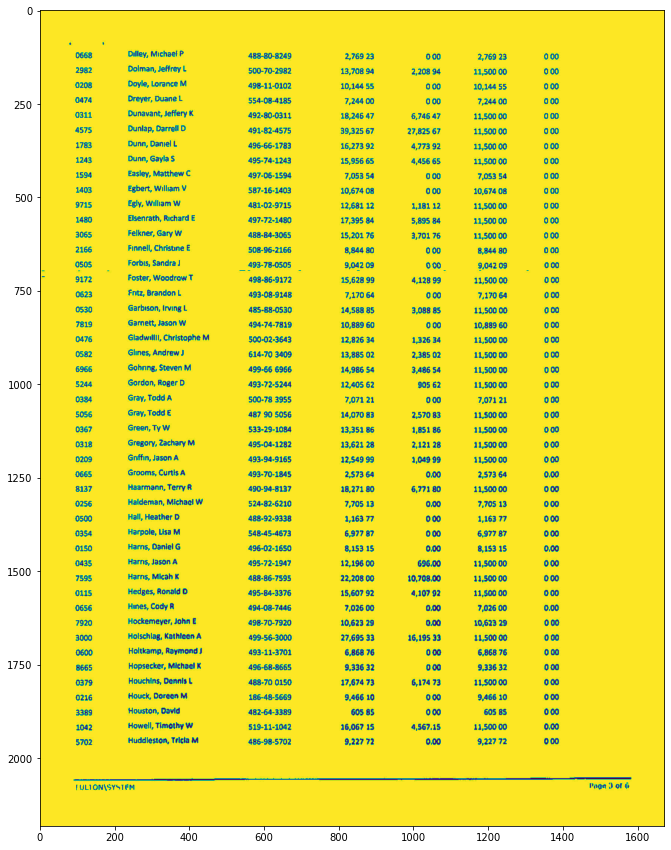

In [53]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
  
# Read Images
img = mpimg.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0393095000.jpeg')

plt.figure(figsize=(15,15))
# Output Images
plt.imshow(img)

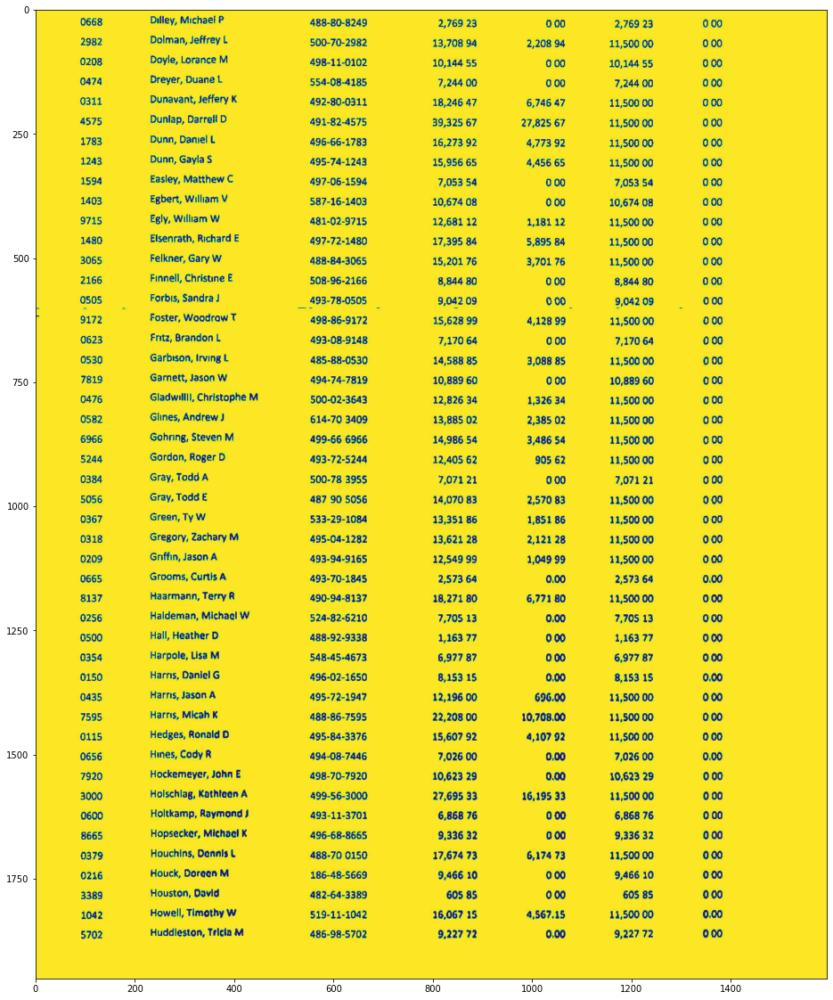

In [73]:
from PIL import Image
import cv2
  
# Opens a image in RGB mode
im = Image.open(r"/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0393095000.jpeg")
#im =cv2.imread('/home/vimal/Documents/table_detect_samples/pre/0347682000.jpeg')
# Size of the image in pixels (size of orginal image)
# (This is not mandatory)
width, height = im.size
  
# Setting the points for cropped image
left = 5
top = height / 23
right = 1600
bottom = 3 * height / 3.2

  
# Cropped image of above dimension
# (It will not change orginal image)
im1 = im.crop((left, top, right, bottom))
plt.figure(figsize=(20,20))
plt.imshow(im1)
im1.save('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0393095000_crop.jpeg')
# Shows the image in image viewer

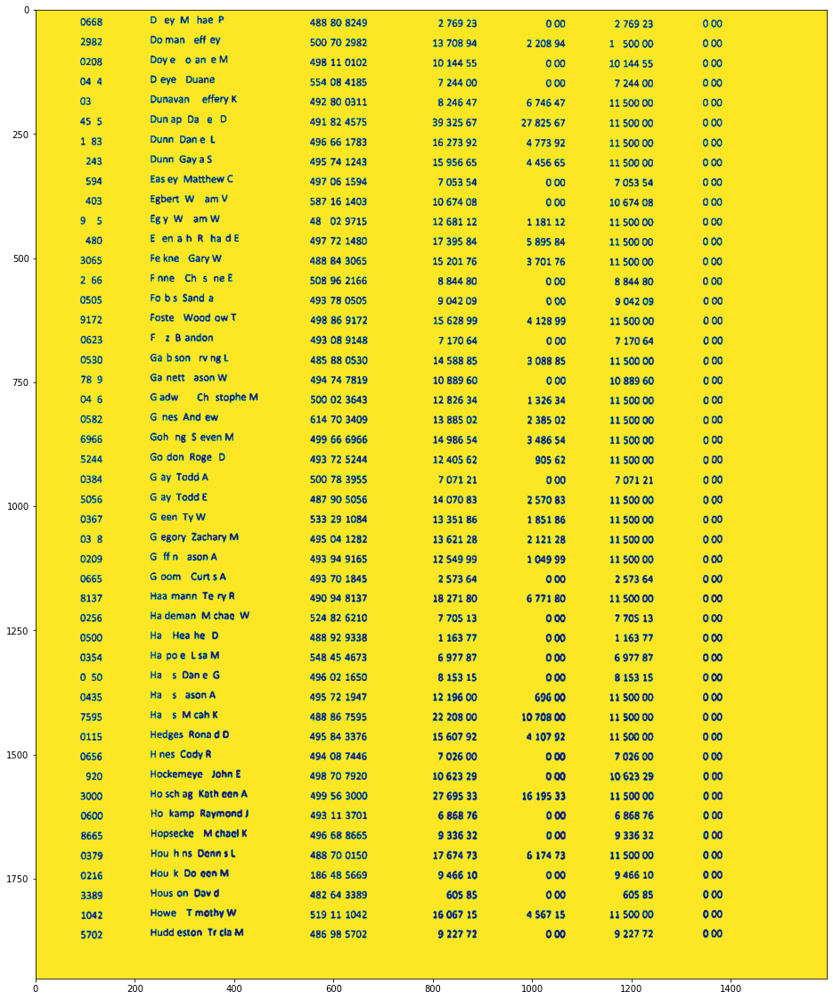

In [75]:
import cv2
import numpy as np
img = cv2.imread("/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0393095000_crop.jpeg", 0)
_, blackAndWhite = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
nlabels, labels, stats, centroids = cv2.connectedComponentsWithStats(blackAndWhite, None, None, None, 8, cv2.CV_32S)
sizes = stats[1:, -1] #get CC_STAT_AREA component
img2 = np.zeros((labels.shape), np.uint8)
for i in range(0, nlabels - 1):
    if sizes[i] >= 50:   #filter small dotted regions
        img2[labels == i + 1] = 255
res = cv2.bitwise_not(img2)

plt.figure(figsize=(20,20))
plt.imshow(res)

In [74]:
import cv2
import pytesseract
from pytesseract import Output
import pandas as pd

img = cv2.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0393095000_crop.jpeg')
img = cv2.resize(img, (int(img.shape[1] + (img.shape[1] * .1)),
                       int(img.shape[0] + (img.shape[0] * .25))),
                 interpolation=cv2.INTER_AREA)

img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789-:.$%./@& *"'
d = pytesseract.image_to_data(img_rgb, config=custom_config, output_type=Output.DICT)
df = pd.DataFrame(d)

df1 = df[(df.conf != '-1') & (df.text != ' ') & (df.text != '')]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

sorted_blocks = df1.groupby('block_num').first().sort_values('top').index.tolist()
for block in sorted_blocks:
    curr = df1[df1['block_num'] == block]
    sel = curr[curr.text.str.len() > 3]
    # sel = curr
    char_w = (sel.width / sel.text.str.len()).mean()
    prev_par, prev_line, prev_left = 0, 0, 0
    text = ''
    for ix, ln in curr.iterrows():
        # add new line when necessary
        if prev_par != ln['par_num']:
            text += '\n'
            prev_par = ln['par_num']
            prev_line = ln['line_num']
            prev_left = 0
        elif prev_line != ln['line_num']:
            text += '\n'
            prev_line = ln['line_num']
            prev_left = 0

        added = 0  # num of spaces that should be added
        if ln['left'] / char_w > prev_left + 1:
            added = int((ln['left']) / char_w) - prev_left
            text += ' ' * added
        text += ln['text'] + ' '
        prev_left += len(ln['text']) + added + 1
    text += '\n'
    print(text)




        0668          Dilley Michaet P              488-80-8249              2.769 23            000          2.769 23         000 
        2982          Dolman Jeffrey L              500-70-2982             13.708 94         2208 94        11500  00         000 
        0208          Dayle Lorance M               498-11-0102             10.144 55            000         10.144 55         000 
        0474          Dreyer. Duane L               554-08-4185              7.244 00            000          7.244 00         000 
        0311          Dunavant Jeffery K            492-80-0311             18246 47          6.746 47       11500  00         000 
       4575           Dunlap Darrell D              491-82-4575             39.325 67        27.825 67       11500  00         000 
        1783          Dunn Daniel L                 496-66-1783             16.273 92         4.773 92       11500  00         000 
        1243          Dunn Gayla $                  495-74-1243            

In [76]:
test1 = text.replace("   ", ",")
print(test1)


,,  0668,,, Dilley Michaet P,,,,  488-80-8249,,,,  2.769 23,,,,000,,, 2.769 23,,,000 
,,  2982,,, Dolman Jeffrey L,,,,  500-70-2982,,,, 13.708 94,,,2208 94,,  11500  00,,,000 
,,  0208,,, Dayle Lorance M,,,,,498-11-0102,,,, 10.144 55,,,,000,,,10.144 55,,,000 
,,  0474,,, Dreyer. Duane L,,,,,554-08-4185,,,,  7.244 00,,,,000,,, 7.244 00,,,000 
,,  0311,,, Dunavant Jeffery K,,,,492-80-0311,,,, 18246 47,,, 6.746 47,, 11500  00,,,000 
,, 4575,,,  Dunlap Darrell D,,,,  491-82-4575,,,, 39.325 67,,  27.825 67,, 11500  00,,,000 
,,  1783,,, Dunn Daniel L,,,,,  496-66-1783,,,, 16.273 92,,,4.773 92,, 11500  00,,,000 
,,  1243,,, Dunn Gayla $,,,,,,495-74-1243,,,, 15.956 65,,,4.456 65,, 11500  00,,,000 
,,  1594,,, Easley. Matthew C,,,, 497-06-1594,,,,  7.053 54,,,,000,,, 7.053 54,,,000 
,,  1403,,, Egbert William V,,,,  587-16-1403,,,, 10.674 08,,,,000,,,10674  08,,,000 
,,  9715,,, Egly. William W,,,,,481-02-9715,,,, 12681 12,,, 1181 12,,  11500  00,,,000 
,,  1480,,, Elsenrath Richard E,,,  497

In [77]:
import re
pattern = re.compile(r'(,){2,}')
x = (re.sub(pattern, ',', test1))



In [84]:
text_file = open("/home/vimal/Documents/table_detect_samples/unstructured tables/text/0393095000_text.txt", "wt")
n = text_file.write(x)
text_file.close()

In [89]:
import pandas as pd

df = pd.read_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/text/0393095000_text.txt')
df = df.dropna(how='all', axis=1)
df.to_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/CSV/0393095000_csv.csv', 
                  index = None)
df = df.drop('Unnamed: 0',axis=1)
df = df.reset_index().T.reset_index().T
df = df.iloc[:,1:]
df

,1,2,3,4,5,6,7
index,0668,Dilley Michaet P,488-80-8249,2.769 23,000,2.769 23,000
0,2982,Dolman Jeffrey L,500-70-2982,13.708 94,2208 94,11500 00,0.0
1,0208,Dayle Lorance M,498-11-0102,10.144 55,000,10.144 55,0.0
2,0474,Dreyer. Duane L,554-08-4185,7.244 00,000,7.244 00,0.0
3,0311,Dunavant Jeffery K,492-80-0311,18246 47,6.746 47,11500 00,0.0
4,4575,Dunlap Darrell D,491-82-4575,39.325 67,27.825 67,11500 00,0.0
5,1783,Dunn Daniel L,496-66-1783,16.273 92,4.773 92,11500 00,0.0
6,1243,Dunn Gayla $,495-74-1243,15.956 65,4.456 65,11500 00,0.0
7,1594,Easley. Matthew C,497-06-1594,7.053 54,000,7.053 54,0.0
8,1403,Egbert William V,587-16-1403,10.674 08,000,10674 08,0.0


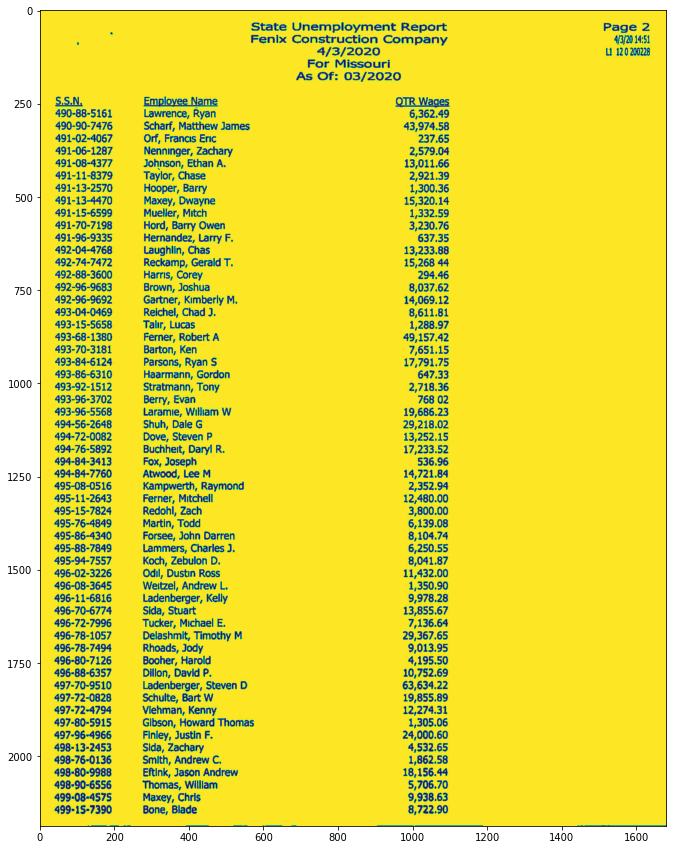

In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
  
# Read Images
img = mpimg.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0762096000.jpeg')

plt.figure(figsize=(15,15))
# Output Images
plt.imshow(img)

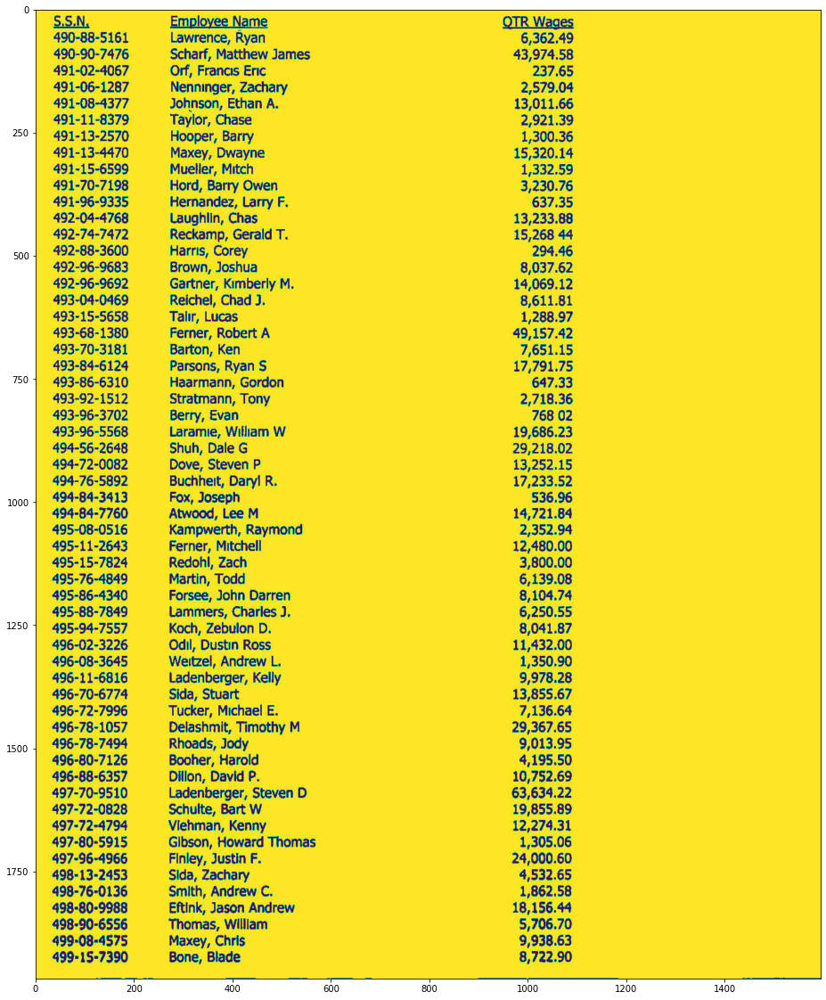

In [2]:
from PIL import Image
import cv2
  
# Opens a image in RGB mode
im = Image.open(r"/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0762096000.jpeg")
#im =cv2.imread('/home/vimal/Documents/table_detect_samples/pre/0347682000.jpeg')
# Size of the image in pixels (size of orginal image)
# (This is not mandatory)
width, height = im.size
  
# Setting the points for cropped image
left = 5
top = height / 10
right = 1600
bottom = 3 * height / 3

  
# Cropped image of above dimension
# (It will not change orginal image)
im1 = im.crop((left, top, right, bottom))
plt.figure(figsize=(20,20))
plt.imshow(im1)
im1.save('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0762096000_crop.jpeg')
# Shows the image in image viewer

In [3]:
import cv2
import pytesseract
from pytesseract import Output
import pandas as pd

img = cv2.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0762096000_crop.jpeg')
img = cv2.resize(img, (int(img.shape[1] + (img.shape[1] * .1)),
                       int(img.shape[0] + (img.shape[0] * .25))),
                 interpolation=cv2.INTER_AREA)

img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789-:.$%./@& *"'
d = pytesseract.image_to_data(img_rgb, config=custom_config, output_type=Output.DICT)
df = pd.DataFrame(d)

df1 = df[(df.conf != '-1') & (df.text != ' ') & (df.text != '')]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

sorted_blocks = df1.groupby('block_num').first().sort_values('top').index.tolist()
for block in sorted_blocks:
    curr = df1[df1['block_num'] == block]
    sel = curr[curr.text.str.len() > 3]
    # sel = curr
    char_w = (sel.width / sel.text.str.len()).mean()
    prev_par, prev_line, prev_left = 0, 0, 0
    text = ''
    for ix, ln in curr.iterrows():
        # add new line when necessary
        if prev_par != ln['par_num']:
            text += '\n'
            prev_par = ln['par_num']
            prev_line = ln['line_num']
            prev_left = 0
        elif prev_line != ln['line_num']:
            text += '\n'
            prev_line = ln['line_num']
            prev_left = 0

        added = 0  # num of spaces that should be added
        if ln['left'] / char_w > prev_left + 1:
            added = int((ln['left']) / char_w) - prev_left
            text += ' ' * added
        text += ln['text'] + ' '
        prev_left += len(ln['text']) + added + 1
    text += '\n'
    print(text)




 S.S.N.            Employee Name                                    QTR Wages 
  490-88-5161      Lawrence. Ryan                                     6.362.49 
  490-90-7476      Scharf Matthew James                              43974.58 
  491-02-4067      Orf. Francis Eric                                    237.65 
  491-06-1287      Nenninger. Zachary                                 2.579.04 
  491-08-4377      Johnson  Ethan A.                                  13.011.66 
  491-11-8379      Taylor. Chase                                      2921.39 
  491-13-2570      Hooper. Barry                                       1.300.36 
  491-13-4470      Maxey  Dwayne                                     15.320.14 
  491-15-6599      Mueller. Mitch                                      1332.59 
  491-70-7198      Hord. Barry Owen                                   3230.76 
  491-96-9335      Hernandez  Larry F.                                  637.35 
  492-04-4768      Laughlin Chas         

In [4]:
test1 = text.replace("   ", ",")
print(test1)


 S.S.N.,,,,Employee Name,,,,,,,,,,,,QTR Wages 
  490-88-5161,,Lawrence. Ryan,,,,,,,,,,,, 6.362.49 
  490-90-7476,,Scharf Matthew James,,,,,,,,,,43974.58 
  491-02-4067,,Orf. Francis Eric,,,,,,,,,,,,237.65 
  491-06-1287,,Nenninger. Zachary,,,,,,,,,,,2.579.04 
  491-08-4377,,Johnson  Ethan A.,,,,,,,,,,, 13.011.66 
  491-11-8379,,Taylor. Chase,,,,,,,,,,,,  2921.39 
  491-13-2570,,Hooper. Barry,,,,,,,,,,,,,1.300.36 
  491-13-4470,,Maxey  Dwayne,,,,,,,,,,,, 15.320.14 
  491-15-6599,,Mueller. Mitch,,,,,,,,,,,,  1332.59 
  491-70-7198,,Hord. Barry Owen,,,,,,,,,,,  3230.76 
  491-96-9335,,Hernandez  Larry F.,,,,,,,,,,, 637.35 
  492-04-4768,,Laughlin Chas,,,,,,,,,,,, 13.233.88 
  492-74-7472,,Reckamp  Gerald T.,,,,,,,,,,  15.268 44 
  492-88-3600,,Harris Corey,,,,,,,,,,,,,  294.46 
  492-96-9683,,Brown. Joshua,,,,,,,,,,,,  8037.62 
  492-96-9692,,Gartner Kimberly M.,,,,,,,,,, 14069.12 
  493-04-0469,,Reichel. Chad J.,,,,,,,,,,,  8.611.81 
  493-15-5658,,Talir Lucas,,,,,,,,,,,,,  1288.97 
  4

In [5]:
import re
pattern = re.compile(r'(,){2,}')
x = (re.sub(pattern, ',', test1))



In [6]:
text_file = open("/home/vimal/Documents/table_detect_samples/unstructured tables/text/0762096000_text.txt", "wt")
n = text_file.write(x)
text_file.close()

In [7]:
import pandas as pd

df = pd.read_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/text/0762096000_text.txt')
df = df.dropna(how='all', axis=1)
df.to_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/CSV/0762096000_csv.csv', 
                  index = None)
#df = df.drop('Unnamed: 0',axis=1)
#df = df.reset_index().T.reset_index().T
#df = df.iloc[:,1:]
df

,S.S.N.,Employee Name,QTR Wages
0,490-88-5161,Lawrence. Ryan,6.362.49
1,490-90-7476,Scharf Matthew James,43974.58
2,491-02-4067,Orf. Francis Eric,237.65
3,491-06-1287,Nenninger. Zachary,2.579.04
4,491-08-4377,Johnson Ethan A.,13.011.66
5,491-11-8379,Taylor. Chase,2921.39
6,491-13-2570,Hooper. Barry,1.300.36
7,491-13-4470,Maxey Dwayne,15.320.14
8,491-15-6599,Mueller. Mitch,1332.59
9,491-70-7198,Hord. Barry Owen,3230.76


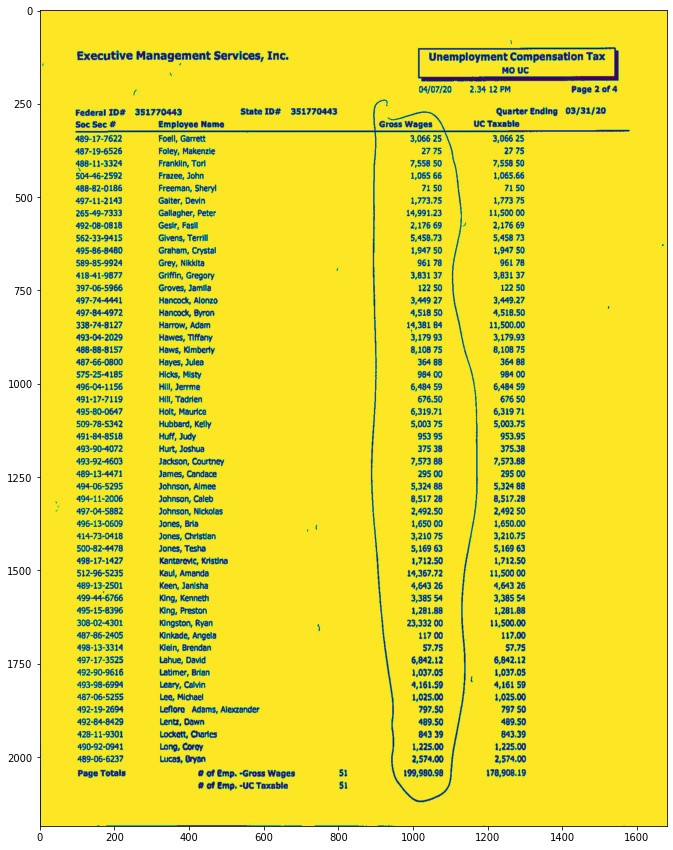

In [8]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
  
# Read Images
img = mpimg.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0121270000.jpeg')

plt.figure(figsize=(15,15))
# Output Images
plt.imshow(img)

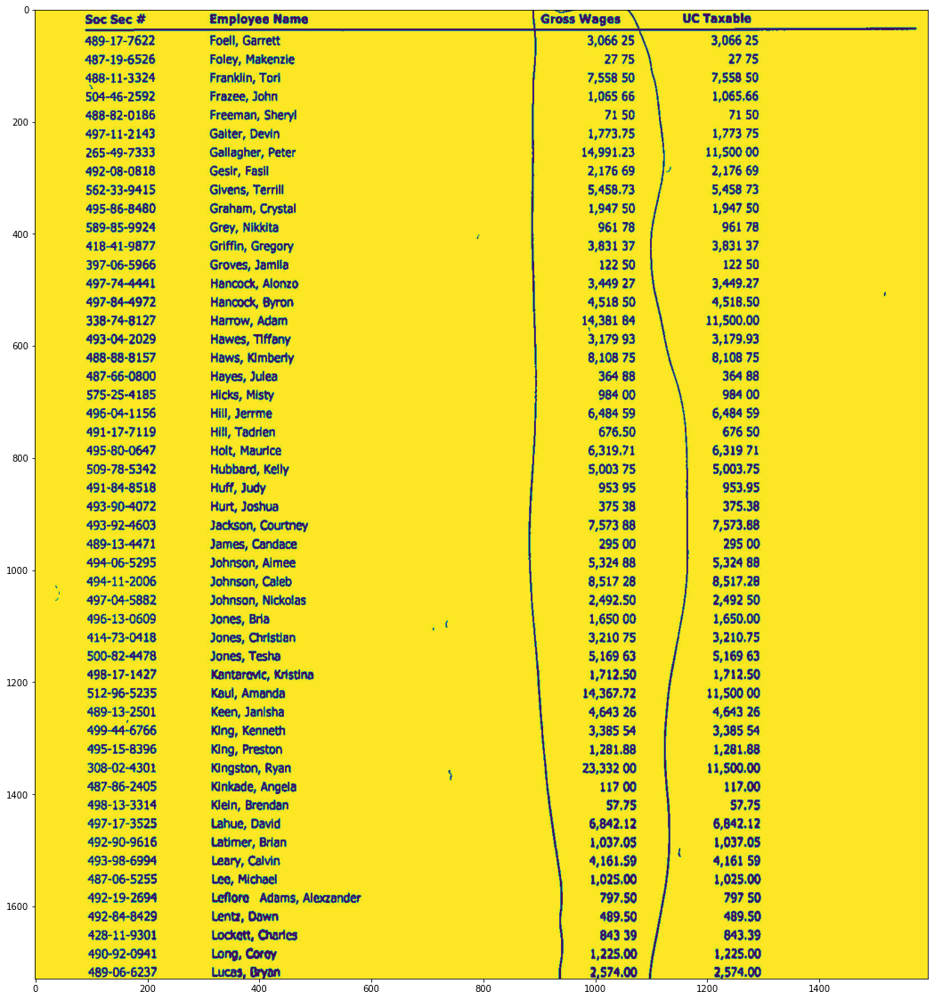

In [22]:
from PIL import Image
import cv2
  
# Opens a image in RGB mode
im = Image.open(r"/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0121270000.jpeg")
#im =cv2.imread('/home/vimal/Documents/table_detect_samples/pre/0347682000.jpeg')
# Size of the image in pixels (size of orginal image)
# (This is not mandatory)
width, height = im.size
  
# Setting the points for cropped image
left = 5
top = height / 7.6
right = 1600
bottom = 3 * height / 3.25

  
# Cropped image of above dimension
# (It will not change orginal image)
im1 = im.crop((left, top, right, bottom))
plt.figure(figsize=(20,20))
plt.imshow(im1)
im1.save('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0121270000_crop.jpeg')
# Shows the image in image viewer

In [23]:
import cv2
import pytesseract
from pytesseract import Output
import pandas as pd

img = cv2.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0121270000_crop.jpeg')
img = cv2.resize(img, (int(img.shape[1] + (img.shape[1] * .1)),
                       int(img.shape[0] + (img.shape[0] * .25))),
                 interpolation=cv2.INTER_AREA)

img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789-:.$%./@& *"'
d = pytesseract.image_to_data(img_rgb, config=custom_config, output_type=Output.DICT)
df = pd.DataFrame(d)

df1 = df[(df.conf != '-1') & (df.text != ' ') & (df.text != '')]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

sorted_blocks = df1.groupby('block_num').first().sort_values('top').index.tolist()
for block in sorted_blocks:
    curr = df1[df1['block_num'] == block]
    sel = curr[curr.text.str.len() > 3]
    # sel = curr
    char_w = (sel.width / sel.text.str.len()).mean()
    prev_par, prev_line, prev_left = 0, 0, 0
    text = ''
    for ix, ln in curr.iterrows():
        # add new line when necessary
        if prev_par != ln['par_num']:
            text += '\n'
            prev_par = ln['par_num']
            prev_line = ln['line_num']
            prev_left = 0
        elif prev_line != ln['line_num']:
            text += '\n'
            prev_line = ln['line_num']
            prev_left = 0

        added = 0  # num of spaces that should be added
        if ln['left'] / char_w > prev_left + 1:
            added = int((ln['left']) / char_w) - prev_left
            text += ' ' * added
        text += ln['text'] + ' '
        prev_left += len(ln['text']) + added + 1
    text += '\n'
    print(text)




        Soc Sec             Employee  Name                                      Gross  Wages            UC Taxable 
       489-17-7622          Foell. Garrett                                               3066 25            3.066 25 
       487-19-6526          Foley Makenzie                                                 2775                2775 
      488-11-3324           Franklin. Tori                                               7.558 50            7.558 50 
        504-46-2592         Frazee. John                                                 1065 66             1065.66 
        488-82-0186         Freeman  Sheryl                                                7150                7150 
        497-11-2143         Galter. Devin                                                1773.75             1773 75 
        265-49-7333         Gallagher. Peter                                            14.991.23           11.500 00 
        492-08-0818         Gesir. Fasil                 

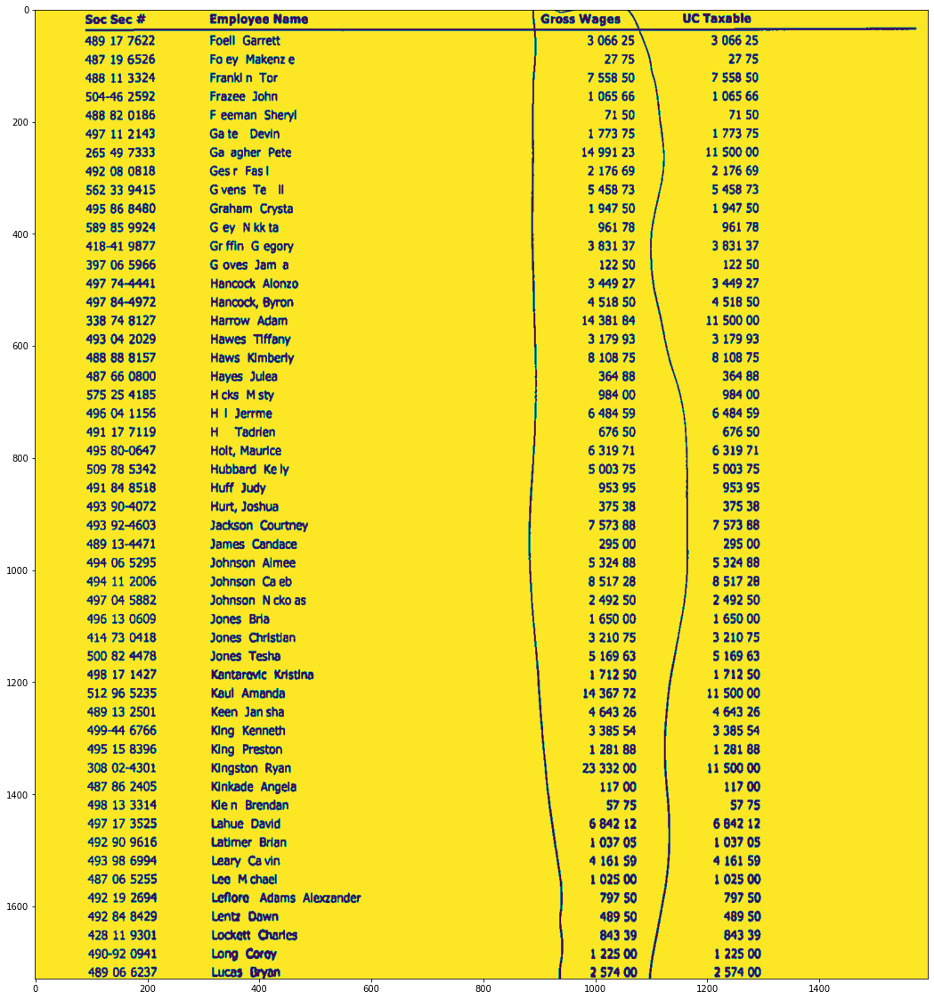

In [24]:
import cv2
import numpy as np
img = cv2.imread("/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0121270000_crop.jpeg", 0)
_, blackAndWhite = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
nlabels, labels, stats, centroids = cv2.connectedComponentsWithStats(blackAndWhite, None, None, None, 8, cv2.CV_32S)
sizes = stats[1:, -1] #get CC_STAT_AREA component
img2 = np.zeros((labels.shape), np.uint8)
for i in range(0, nlabels - 1):
    if sizes[i] >= 50:   #filter small dotted regions
        img2[labels == i + 1] = 255
res = cv2.bitwise_not(img2)

plt.figure(figsize=(20,20))
plt.imshow(res)

from PIL import Image
im = Image.fromarray(res)
im.save("/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0121270000_crop.jpeg")

In [25]:
import cv2
import pytesseract
from pytesseract import Output
import pandas as pd

img = cv2.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0121270000_crop.jpeg')
img = cv2.resize(img, (int(img.shape[1] + (img.shape[1] * .1)),
                       int(img.shape[0] + (img.shape[0] * .25))),
                 interpolation=cv2.INTER_AREA)

img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789-:.$%./@& *"'
d = pytesseract.image_to_data(img_rgb, config=custom_config, output_type=Output.DICT)
df = pd.DataFrame(d)

df1 = df[(df.conf != '-1') & (df.text != ' ') & (df.text != '')]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

sorted_blocks = df1.groupby('block_num').first().sort_values('top').index.tolist()
for block in sorted_blocks:
    curr = df1[df1['block_num'] == block]
    sel = curr[curr.text.str.len() > 3]
    # sel = curr
    char_w = (sel.width / sel.text.str.len()).mean()
    prev_par, prev_line, prev_left = 0, 0, 0
    text = ''
    for ix, ln in curr.iterrows():
        # add new line when necessary
        if prev_par != ln['par_num']:
            text += '\n'
            prev_par = ln['par_num']
            prev_line = ln['line_num']
            prev_left = 0
        elif prev_line != ln['line_num']:
            text += '\n'
            prev_line = ln['line_num']
            prev_left = 0

        added = 0  # num of spaces that should be added
        if ln['left'] / char_w > prev_left + 1:
            added = int((ln['left']) / char_w) - prev_left
            text += ' ' * added
        text += ln['text'] + ' '
        prev_left += len(ln['text']) + added + 1
    text += '\n'
    print(text)




       Soc Sec            Employee  Name                                     Gross Wages           UC Taxable 
       489 17 7622        Foell Garrett                                              3 066 25           3 066 25 
       487 19 6526         Fo ey Makenz e                                              2775               27:75 
       488 11 3324         Frankl n Tor                                              7558 50            7 558 50 
       504-46 2592         Frazee John                                               1065 66            1065 66 
       488 82 0186         F eeman Sheryl                                              7150                7150 
       497 11 2143        Gate   Devin                                               177375             177375 
       265 49 7333        Ga  agher Pete                                            14991 23           11 500 00 
       492 08 0818        Gesr  Fas                                                  2176 69   

In [32]:
test1 = text.replace("    ", ",")
print(test1)


,   Soc Sec,,,Employee  Name,,,,,,,,, Gross Wages,,   UC Taxable 
,   489 17 7622,,Foell Garrett,,,,,,,,,,,  3 066 25,,   3 066 25 
,   487 19 6526,, Fo ey Makenz e,,,,,,,,,,,  2775,,,   27:75 
,   488 11 3324,, Frankl n Tor,,,,,,,,,,,  7558 50,,,7 558 50 
,   504-46 2592,, Frazee John,,,,,,,,,,,   1065 66,,,1065 66 
,   488 82 0186,, F eeman Sheryl,,,,,,,,,,,  7150,,,,7150 
,   497 11 2143,,Gate   Devin,,,,,,,,,,,   177375,,, 177375 
,   265 49 7333,,Ga  agher Pete,,,,,,,,,,,14991 23,,   11 500 00 
,   492 08 0818,,Gesr  Fas,,,,,,,,,,,,  2176 69,,,2 176 69 
,   562 33 9415,,Gvens  Te  Il,,,,,,,,,,,  5 458 73,,   5 458 73 
,   495 86 8480,,Graham  Crysta,,,,,,,,,,, 194750,,, 1947 50 
,   589 85 9924,,G ey  Nkkta,,,,,,,,,,,, 961 78,,, 961 78 
,   418-41 9877,,Gr ffin G egory,,,,,,,,,,,3 831 37,,   3 831 37 
,   397 06 5966,,G oves Jam  a,,,,,,,,,,,,122 50,,, 122 50 
,   497 74-4441,, Hancock Alonzo,,,,,,,,,,,3 449 27,,   3449 27 
,   497 84-4972,, Hancock Byron,,,,,,,,,,, 4518 50,,,451

In [33]:
import re
pattern = re.compile(r'(,){2,}')
x = (re.sub(pattern, ',', test1))



In [34]:
text_file = open("/home/vimal/Documents/table_detect_samples/unstructured tables/text/0121270000_text.txt", "wt")
n = text_file.write(x)
text_file.close()

In [35]:
import pandas as pd

df = pd.read_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/text/0121270000_text.txt')
df = df.dropna(how='all', axis=1)
df.to_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/CSV/0121270000_csv.csv', 
                  index = None)
#df = df.drop('Unnamed: 0',axis=1)
#df = df.reset_index().T.reset_index().T
#df = df.iloc[:,1:]
df

,Soc Sec,Employee Name,Gross Wages,UC Taxable
0,489 17 7622,Foell Garrett,3 066 25,3 066 25
1,487 19 6526,Fo ey Makenz e,2775,27:75
2,488 11 3324,Frankl n Tor,7558 50,7 558 50
3,504-46 2592,Frazee John,1065 66,1065 66
4,488 82 0186,F eeman Sheryl,7150,7150
5,497 11 2143,Gate Devin,177375,177375
6,265 49 7333,Ga agher Pete,14991 23,11 500 00
7,492 08 0818,Gesr Fas,2176 69,2 176 69
8,562 33 9415,Gvens Te Il,5 458 73,5 458 73
9,495 86 8480,Graham Crysta,194750,1947 50


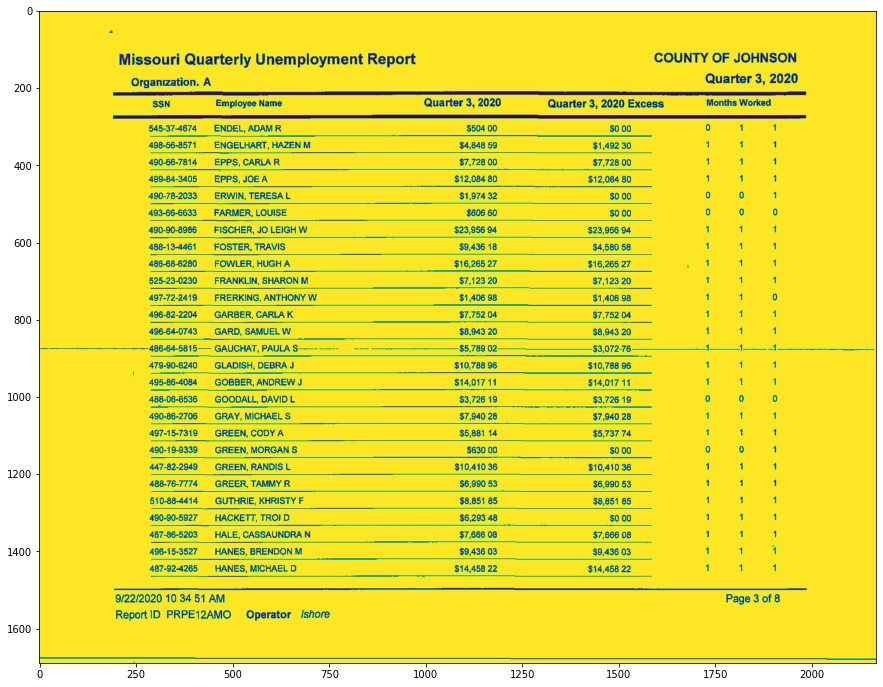

In [24]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
  
# Read Images
img = mpimg.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0379414000.jpeg')

plt.figure(figsize=(15,15))
# Output Images
plt.imshow(img)

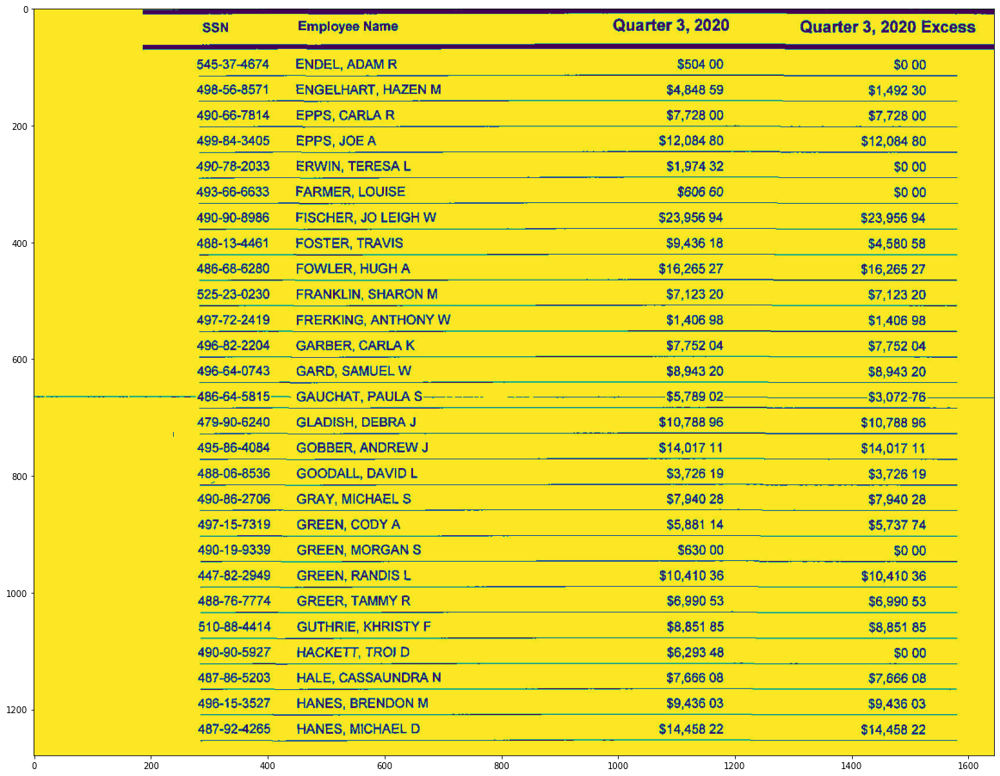

In [33]:
from PIL import Image
import cv2
  
# Opens a image in RGB mode
im = Image.open(r"/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0379414000.jpeg")
#im =cv2.imread('/home/vimal/Documents/table_detect_samples/pre/0347682000.jpeg')
# Size of the image in pixels (size of orginal image)
# (This is not mandatory)
width, height = im.size
  
# Setting the points for cropped image
left = 5
top = height / 8
right = 1650
bottom = 3 * height / 3.4

  
# Cropped image of above dimension
# (It will not change orginal image)
im1 = im.crop((left, top, right, bottom))
plt.figure(figsize=(20,20))
plt.imshow(im1)
im1.save('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0379414000_crop.jpeg')
# Shows the image in image viewer

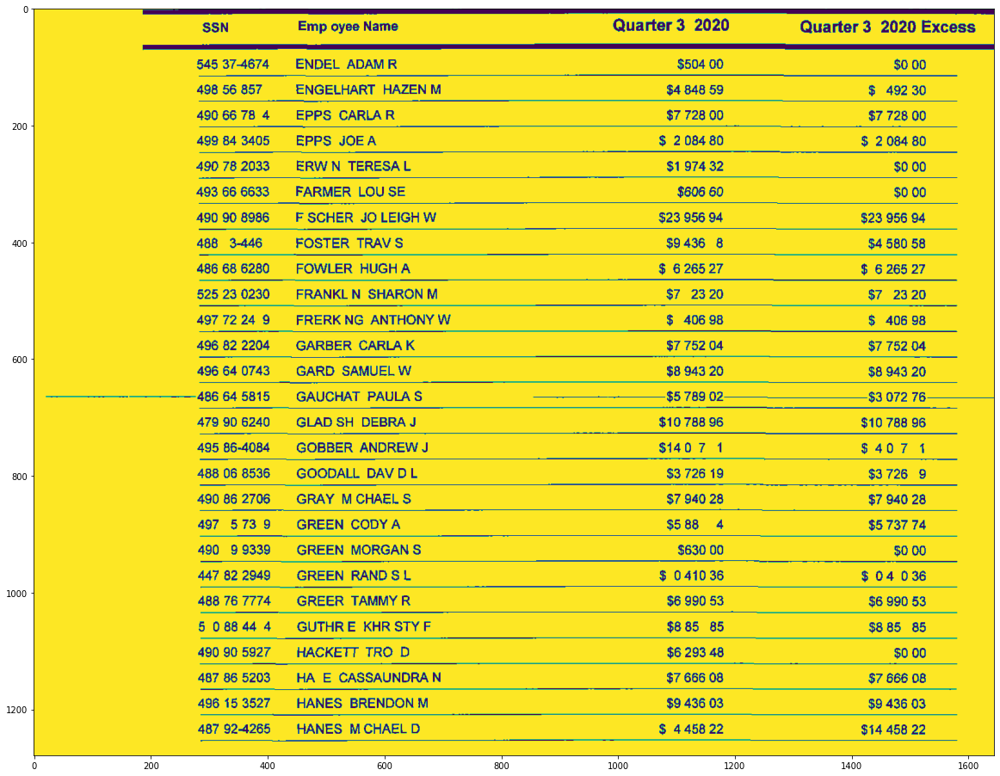

In [35]:
import cv2
import numpy as np
img = cv2.imread("/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0379414000_crop.jpeg", 0)
_, blackAndWhite = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
nlabels, labels, stats, centroids = cv2.connectedComponentsWithStats(blackAndWhite, None, None, None, 8, cv2.CV_32S)
sizes = stats[1:, -1] #get CC_STAT_AREA component
img2 = np.zeros((labels.shape), np.uint8)
for i in range(0, nlabels - 1):
    if sizes[i] >= 50:   #filter small dotted regions
        img2[labels == i + 1] = 255
res = cv2.bitwise_not(img2)

plt.figure(figsize=(20,20))
plt.imshow(res)

from PIL import Image
im = Image.fromarray(res)
im.save("/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0379414000_crop.jpeg")

In [36]:
import cv2
import pytesseract
from pytesseract import Output
import pandas as pd

img = cv2.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0379414000_crop.jpeg')
img = cv2.resize(img, (int(img.shape[1] + (img.shape[1] * .1)),
                       int(img.shape[0] + (img.shape[0] * .25))),
                 interpolation=cv2.INTER_AREA)

img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789-:.$%./@& *"'
d = pytesseract.image_to_data(img_rgb, config=custom_config, output_type=Output.DICT)
df = pd.DataFrame(d)

df1 = df[(df.conf != '-1') & (df.text != ' ') & (df.text != '')]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

sorted_blocks = df1.groupby('block_num').first().sort_values('top').index.tolist()
for block in sorted_blocks:
    curr = df1[df1['block_num'] == block]
    sel = curr[curr.text.str.len() > 3]
    # sel = curr
    char_w = (sel.width / sel.text.str.len()).mean()
    prev_par, prev_line, prev_left = 0, 0, 0
    text = ''
    for ix, ln in curr.iterrows():
        # add new line when necessary
        if prev_par != ln['par_num']:
            text += '\n'
            prev_par = ln['par_num']
            prev_line = ln['line_num']
            prev_left = 0
        elif prev_line != ln['line_num']:
            text += '\n'
            prev_line = ln['line_num']
            prev_left = 0

        added = 0  # num of spaces that should be added
        if ln['left'] / char_w > prev_left + 1:
            added = int((ln['left']) / char_w) - prev_left
            text += ' ' * added
        text += ln['text'] + ' '
        prev_left += len(ln['text']) + added + 1
    text += '\n'
    print(text)




                SSN      Emp oyee Name                  Quarter 3 2020    Quarter 3 2020 Excess 
               545 37-4674 ENDEL ADAMR                        $504 00              $0 00 
               498 56857  ENGELHART HAZENM                   $4 848 59           $ 492 30 
               4906678 4 EPPS CARLAR                         $7 728 00           $7 728 00 
               499 843405 EPPS JOEA                          $ 2084 80          $ 2084 80 
               490 78 2033 ERWN TERESAL                      $1 974 32             $0 00 
               493 66 6633 FARMER LOU SE                      $606 60              $0 00 
               490908986 FSCHER JOLEIGHW                   8395694       sssttsCi 28 08 
               488 344  FOSTERTRAVS ANGBsCiiz*SSQSGOSSC*W 
               4g686280 FOWLERHUGHA  sssisisi                  HHT                 BST 
                525 230230  FRANKLN SHARONM                  $7 2320             $7 2320 
               49772249  FRERKNG

In [41]:
test1 = text.replace("  ", ",")
print(test1)


,,,,,,,,SSN,,,Emp oyee Name,,,,,,,,,Quarter 3 2020,,Quarter 3 2020 Excess 
,,,,,,, 545 37-4674 ENDEL ADAMR,,,,,,,,,,,,$504 00,,,,,,,$0 00 
,,,,,,, 498 56857,ENGELHART HAZENM,,,,,,,,, $4 848 59,,,,, $ 492 30 
,,,,,,, 4906678 4 EPPS CARLAR,,,,,,,,,,,, $7 728 00,,,,, $7 728 00 
,,,,,,, 499 843405 EPPS JOEA,,,,,,,,,,,,,$ 2084 80,,,,,$ 2084 80 
,,,,,,, 490 78 2033 ERWN TERESAL,,,,,,,,,,,$1 974 32,,,,,, $0 00 
,,,,,,, 493 66 6633 FARMER LOU SE,,,,,,,,,,,$606 60,,,,,,,$0 00 
,,,,,,, 490908986 FSCHER JOLEIGHW,,,,,,,,, 8395694,,, sssttsCi 28 08 
,,,,,,, 488 344,FOSTERTRAVS ANGBsCiiz*SSQSGOSSC*W 
,,,,,,, 4g686280 FOWLERHUGHA,sssisisi,,,,,,,,,HHT,,,,,,,, BST 
,,,,,,,,525 230230,FRANKLN SHARONM,,,,,,,,,$7 2320,,,,,, $7 2320 
,,,,,,, 49772249,FRERKNG ANTHONY W,,,,,,,,, $ 40698,,,,,, $ 406 98 
,,,,,,, 496 82 2204 GARBER CARLAK,,,,,,,,,, $7 752 04,,,,, $7 752 04 
,,,,,,,,496 640743. GARD SAMUEL W,,,,,,,,,,$8 943 20,,,,, $8 943 20 
,,,,,,, 486 645815 GAUCHAT PAULAS,,,,,,,,,, $5 78002,,,,,,$3072 78 
,

In [48]:
import re
pattern = re.compile(r'(,){2,}')
x = (re.sub(pattern, ',', test1))



In [49]:
text_file = open("/home/vimal/Documents/table_detect_samples/unstructured tables/text/0379414000_text.txt", "wt")
n = text_file.write(x)
text_file.close()

In [50]:
import pandas as pd

df = pd.read_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/text/0379414000_text.txt')
df = df.dropna(how='all', axis=1)
df.to_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/CSV/0379414000_csv.csv', 
                  index = None)
#df = df.drop('Unnamed: 0',axis=1)
#df = df.reset_index().T.reset_index().T
#df = df.iloc[:,1:]
df

,SSN,Emp oyee Name,Quarter 3 2020,Quarter 3 2020 Excess
0,545 37-4674 ENDEL ADAMR,$504 00,$0 00,NaN
1,498 56857,ENGELHART HAZENM,$4 848 59,$ 492 30
2,4906678 4 EPPS CARLAR,$7 728 00,$7 728 00,NaN
3,499 843405 EPPS JOEA,$ 2084 80,$ 2084 80,NaN
4,490 78 2033 ERWN TERESAL,$1 974 32,$0 00,NaN
5,493 66 6633 FARMER LOU SE,$606 60,$0 00,NaN
6,490908986 FSCHER JOLEIGHW,8395694,sssttsCi 28 08,NaN
7,488 344,FOSTERTRAVS ANGBsCiiz*SSQSGOSSC*W,NaN,NaN
8,4g686280 FOWLERHUGHA,sssisisi,HHT,BST
9,525 230230,FRANKLN SHARONM,$7 2320,$7 2320


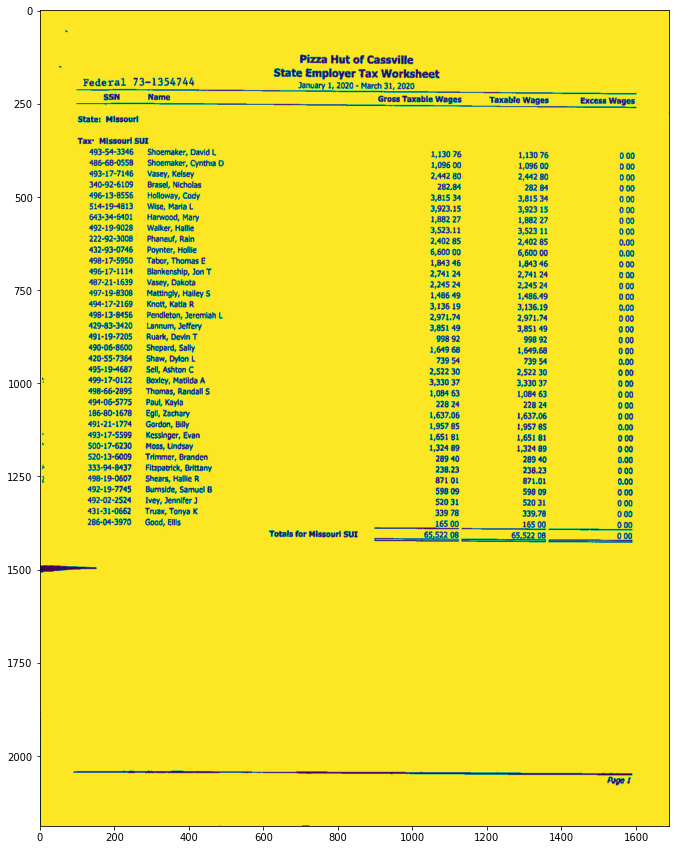

In [73]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
  
# Read Images
img = mpimg.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0239379000.jpeg')

plt.figure(figsize=(15,15))
# Output Images
plt.imshow(img)

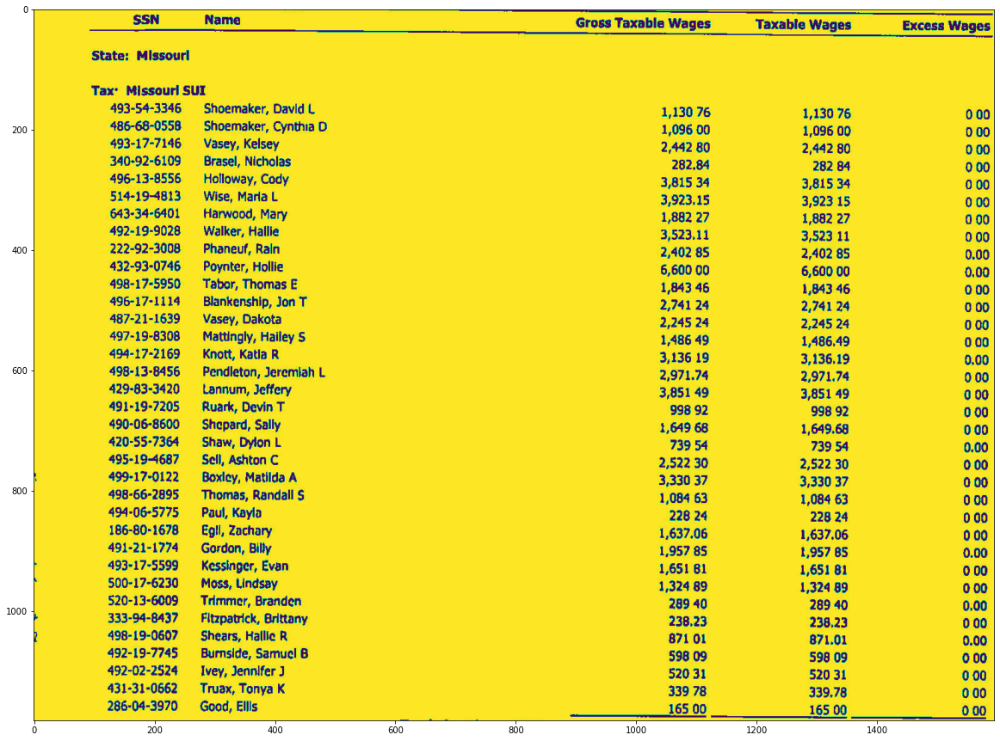

In [86]:
from PIL import Image
import cv2
  
# Opens a image in RGB mode
im = Image.open(r"/home/vimal/Documents/table_detect_samples/unstructured tables/Input/0239379000.jpeg")
#im =cv2.imread('/home/vimal/Documents/table_detect_samples/pre/0347682000.jpeg')
# Size of the image in pixels (size of orginal image)
# (This is not mandatory)
width, height = im.size
  
# Setting the points for cropped image
left = 5
top = height / 10.2
right = 1600
bottom = 3 * height / 4.7

  
# Cropped image of above dimension
# (It will not change orginal image)
im1 = im.crop((left, top, right, bottom))
plt.figure(figsize=(20,20))
plt.imshow(im1)
im1.save('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0239379000_crop.jpeg')
# Shows the image in image viewer

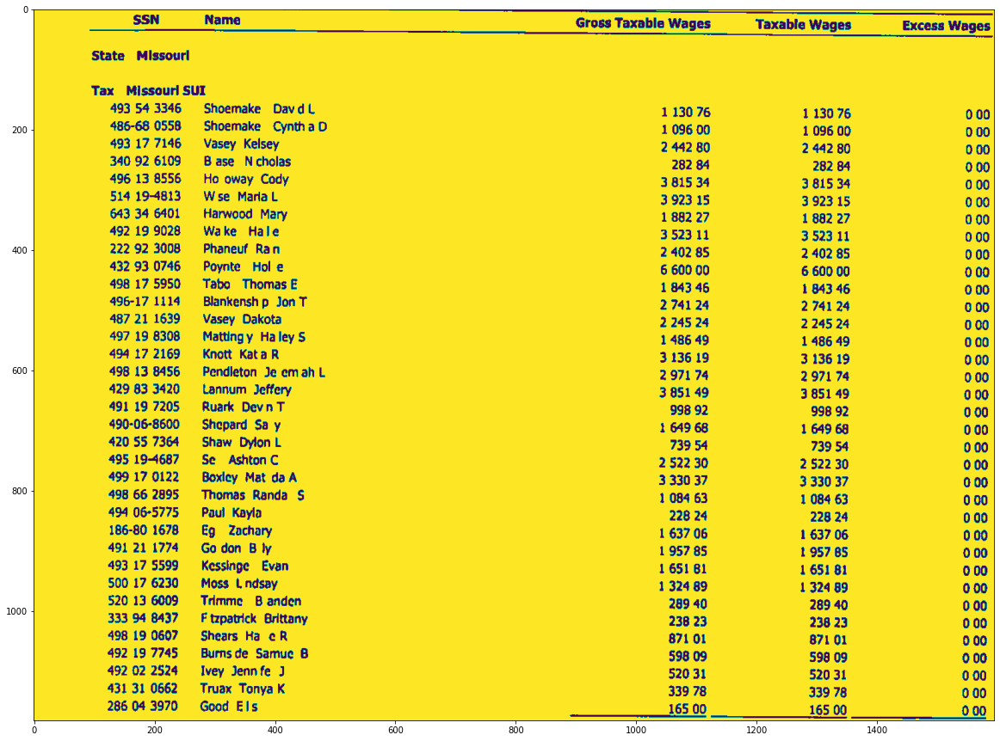

In [87]:
import cv2
import numpy as np
img = cv2.imread("/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0239379000_crop.jpeg", 0)
_, blackAndWhite = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
nlabels, labels, stats, centroids = cv2.connectedComponentsWithStats(blackAndWhite, None, None, None, 8, cv2.CV_32S)
sizes = stats[1:, -1] #get CC_STAT_AREA component
img2 = np.zeros((labels.shape), np.uint8)
for i in range(0, nlabels - 1):
    if sizes[i] >= 50:   #filter small dotted regions
        img2[labels == i + 1] = 255
res = cv2.bitwise_not(img2)

plt.figure(figsize=(20,20))
plt.imshow(res)

from PIL import Image
im = Image.fromarray(res)
im.save("/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0239379000_crop.jpeg")

In [88]:
import cv2
import pytesseract
from pytesseract import Output
import pandas as pd

img = cv2.imread('/home/vimal/Documents/table_detect_samples/unstructured tables/crop_images/0239379000_crop.jpeg')
img = cv2.resize(img, (int(img.shape[1] + (img.shape[1] * .1)),
                       int(img.shape[0] + (img.shape[0] * .25))),
                 interpolation=cv2.INTER_AREA)

img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789-:.$%./@& *"'
d = pytesseract.image_to_data(img_rgb, config=custom_config, output_type=Output.DICT)
df = pd.DataFrame(d)

df1 = df[(df.conf != '-1') & (df.text != ' ') & (df.text != '')]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

sorted_blocks = df1.groupby('block_num').first().sort_values('top').index.tolist()
for block in sorted_blocks:
    curr = df1[df1['block_num'] == block]
    sel = curr[curr.text.str.len() > 3]
    # sel = curr
    char_w = (sel.width / sel.text.str.len()).mean()
    prev_par, prev_line, prev_left = 0, 0, 0
    text = ''
    for ix, ln in curr.iterrows():
        # add new line when necessary
        if prev_par != ln['par_num']:
            text += '\n'
            prev_par = ln['par_num']
            prev_line = ln['line_num']
            prev_left = 0
        elif prev_line != ln['line_num']:
            text += '\n'
            prev_line = ln['line_num']
            prev_left = 0

        added = 0  # num of spaces that should be added
        if ln['left'] / char_w > prev_left + 1:
            added = int((ln['left']) / char_w) - prev_left
            text += ' ' * added
        text += ln['text'] + ' '
        prev_left += len(ln['text']) + added + 1
    text += '\n'
    print(text)




             SSN        Name                                                 Gross Taxable Wages       Taxable Wages        Excess Wages 
                                             hv                               ESE                  CX       NC Wages       EXCESS Wages 
        State Missourl 
        Tax  Missouri SUI 
           493 54 3346  Shoemake  Davdl                                                   1130 76             113076                 000 
           486-68 0558  Shoemake  CynthaD                                                 1096 00             1096 00                000 
           493 177146   Vasey Kelsey                                                      2 442 80            2 442 80               000 
           340 92 6109  Base  Ncholas                                                      282 84              282 84                000 
           496 13 8556  Ho oway Cody                                                      3 815 34            3815 34    

In [94]:
test1 = text.replace("  ", ",")
print(test1)


,,,,,, SSN,,,,Name,,,,,,,,,,,,,,,,,,,,,,,, Gross Taxable Wages,,, Taxable Wages,,,,Excess Wages 
,,,,,,,,,,,,,,,,,,,,,, hv,,,,,,,,,,,,,,, ESE,,,,,,,,,CX,,, NC Wages,,, EXCESS Wages 
,,,,State Missourl 
,,,,Tax,Missouri SUI 
,,,,, 493 54 3346,Shoemake,Davdl,,,,,,,,,,,,,,,,,,,,,,,,, 1130 76,,,,,, 113076,,,,,,,, 000 
,,,,, 486-68 0558,Shoemake,CynthaD,,,,,,,,,,,,,,,,,,,,,,,, 1096 00,,,,,, 1096 00,,,,,,,,000 
,,,,, 493 177146, Vasey Kelsey,,,,,,,,,,,,,,,,,,,,,,,,,,,2 442 80,,,,,,2 442 80,,,,,,, 000 
,,,,, 340 92 6109,Base,Ncholas,,,,,,,,,,,,,,,,,,,,,,,,,,,282 84,,,,,,,282 84,,,,,,,,000 
,,,,, 496 13 8556,Ho oway Cody,,,,,,,,,,,,,,,,,,,,,,,,,,,3 815 34,,,,,,3815 34,,,,,,,,000 
,,,,, 514 19-4813. Wse,Maral,,,,,,,,,,,,,,,,,,,,,,,,,,,,3923 15,,,,,, 3923 15,,,,,,,,000 
,,,,, 643 34 6401,Harwood Mary,,,,,,,,,,,,,,,,,,,,,,,,,,,1 882 27,,,,,,1882 27,,,,,,,,000 
,,,,, 492 199028, Wake,Hale,,,,,,,,,,,,,,,,,,,,,,,,,,,,3523 11,,,,,, 3523 11,,,,,,,,000 
,,,,, 222 92 3008,Phaneuf Ran,,,,,,,,,,,,,,,,,,,

In [95]:
import re
pattern = re.compile(r'(,){2,}')
x = (re.sub(pattern, ',', test1))



In [96]:
text_file = open("/home/vimal/Documents/table_detect_samples/unstructured tables/text/0239379000_text.txt", "wt")
n = text_file.write(x)
text_file.close()

In [97]:
import pandas as pd

df = pd.read_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/text/0239379000_text.txt')
df = df.dropna(how='all', axis=1)
df.to_csv('/home/vimal/Documents/table_detect_samples/unstructured tables/CSV/0239379000_csv.csv', 
                  index = None)
#df = df.drop('Unnamed: 0',axis=1)
#df = df.reset_index().T.reset_index().T
#df = df.iloc[:,1:]
df

ParserError: Error tokenizing data. C error: Expected 6 fields in line 6, saw 7
